## Code for PDE plots

In [1]:
import numpy as np
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy import stats

from matplotlib import pyplot as plt
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

from datetime import datetime
months =[datetime(2019, imon, 1) for imon in np.arange(1, 12 + 1)]
month_str = [date_obj.strftime('%b') for date_obj in months]
m_str = [w[0] for w in month_str];

# Get color order
prop_cycle = plt.rcParams['axes.prop_cycle']

colors = prop_cycle.by_key()['color']
cc = prop_cycle.by_key()['color']

In [2]:
def save_plot(file_name):
    fig_dir = '/Users/tippett/Library/Mobile Documents/com~apple~CloudDocs/APMA 3102 2021/'
    plt.savefig(fig_dir + file_name + '.png', dpi = 300)
    return

## 1. Advection equation (Lecture 1)

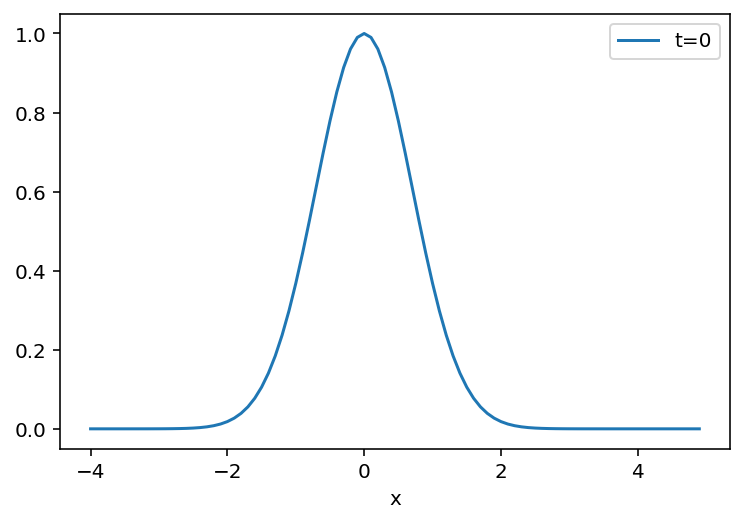

In [3]:
x = np.arange(-4, 5, 0.1)

def f(y):
    return np.exp(-y**2)

plt.plot(x, f(x), label = 't=0');
plt.xlabel('x')
plt.legend();
save_plot('Lecture01/t=0')

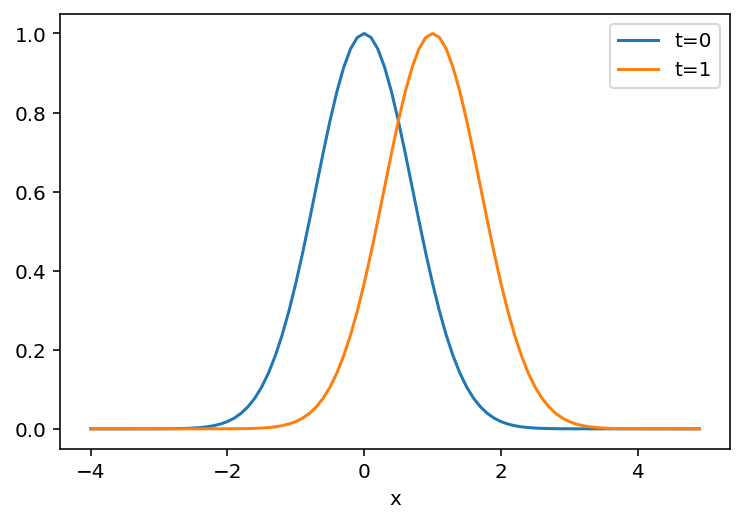

In [4]:
plt.plot(x, f(x), label = 't=0');
plt.xlabel('x')
plt.plot(x, f(x - 1), label = 't=1');
plt.legend();
save_plot('Lecture01/t=1')

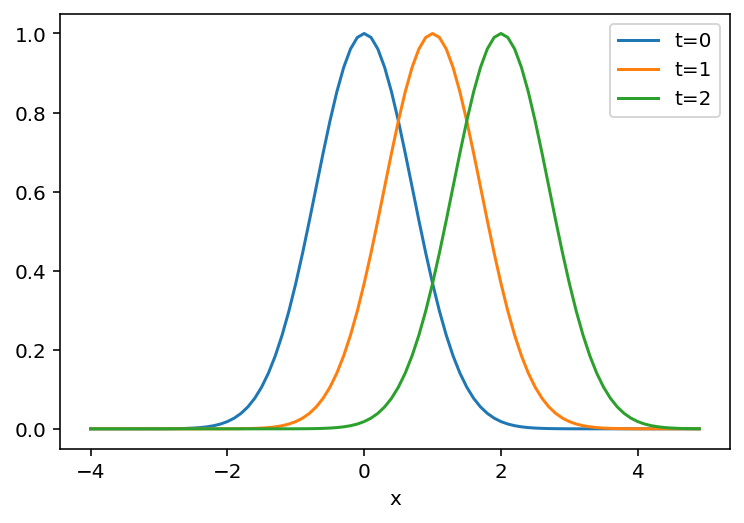

In [5]:
plt.plot(x, f(x), label = 't=0');
plt.xlabel('x')
plt.plot(x, f(x - 1), label = 't=1');
plt.plot(x, f(x - 2), label = 't=2');
plt.legend();
save_plot('Lecture01/t=2')

## 2. $\sin z$

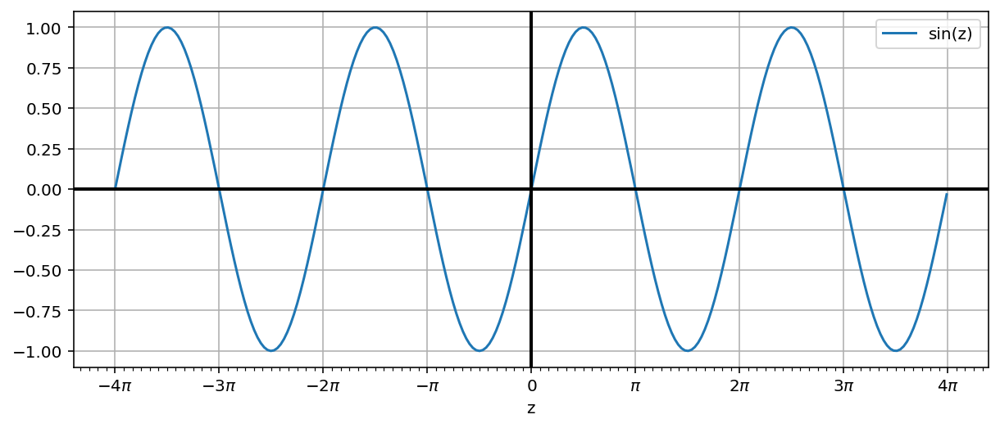

In [6]:
def multiple_formatter(denominator=2, number=np.pi, latex='\pi'):
    def gcd(a, b):
        while b:
            a, b = b, a%b
        return a
    def _multiple_formatter(x, pos):
        den = denominator
        num = np.int(np.rint(den*x/number))
        com = gcd(num,den)
        (num,den) = (int(num/com),int(den/com))
        if den==1:
            if num==0:
                return r'$0$'
            if num==1:
                return r'$%s$'%latex
            elif num==-1:
                return r'$-%s$'%latex
            else:
                return r'$%s%s$'%(num,latex)
        else:
            if num==1:
                return r'$\frac{%s}{%s}$'%(latex,den)
            elif num==-1:
                return r'$\frac{-%s}{%s}$'%(latex,den)
            else:
                return r'$\frac{%s%s}{%s}$'%(num,latex,den)
    return _multiple_formatter

class Multiple:
    def __init__(self, denominator=2, number=np.pi, latex='\pi'):
        self.denominator = denominator
        self.number = number
        self.latex = latex

    def locator(self):
        return plt.MultipleLocator(self.number / self.denominator)

    def formatter(self):
        return plt.FuncFormatter(multiple_formatter(self.denominator, self.number, self.latex))
    
z = np.arange(-4 * np.pi, 4 * np.pi, 0.1)
fig, ax = plt.subplots(figsize = (10, 4))
ax.plot(z, np.sin(z), label = 'sin(z)');
ax.set_xlabel('z')
ax.legend()

#ax = plt.gca()
ax.grid(True)
#ax.set_aspect(4.0)
ax.axhline(0, color='black', lw=2)
ax.axvline(0, color='black', lw=2)
ax.xaxis.set_major_locator(plt.MultipleLocator(np.pi))
ax.xaxis.set_minor_locator(plt.MultipleLocator(np.pi / 12))
ax.xaxis.set_major_formatter(plt.FuncFormatter(multiple_formatter()))
save_plot('sinZ')

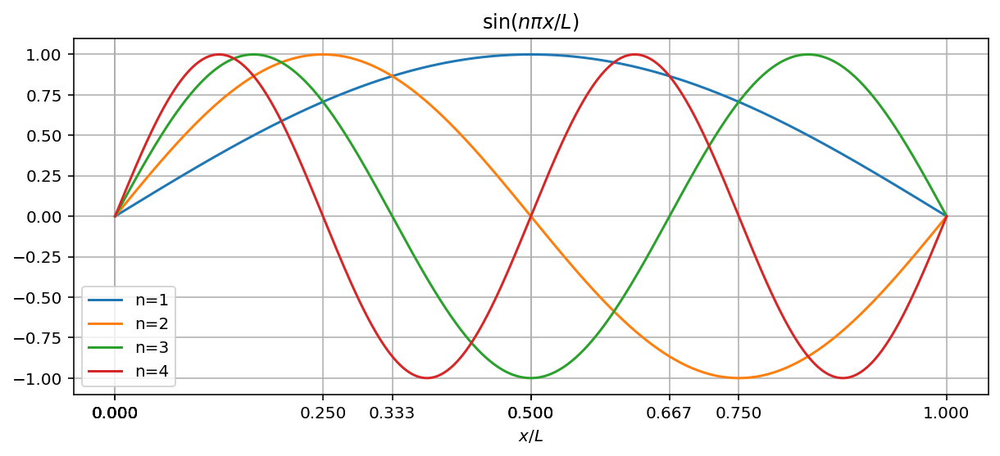

In [7]:
L = 1
dx = 0.001
x = np.arange(0, L + dx, dx)

fig, ax = plt.subplots(figsize = (10, 4))

for n in range(1, 5):
    Lambda = (np.pi * n / L)**2
    phi = np.sin(np.sqrt(Lambda) * x)
    ax.plot(x, phi, label = 'n={:d}'.format(n))
ax.set_xlabel('$x /L$');
ticks = np.sort(np.concatenate([np.arange(0, 2), np.arange(0,2)/2, np.arange(0,3)/3, np.arange(0,4)/4]))
ax.set_xticks(ticks)
ax.grid(True)
ax.legend()
ax.set_title(r'$\sin (n\pi x/L)$')
save_plot('Lecture04/sin2piNL')

## 3. 1D heat equation with with zero boundary conditions

$$ u_t = k u_{xx} $$
$$ u(0, t) = u(L, t) = 0 $$
$$ u(x, 0) = 1 $$

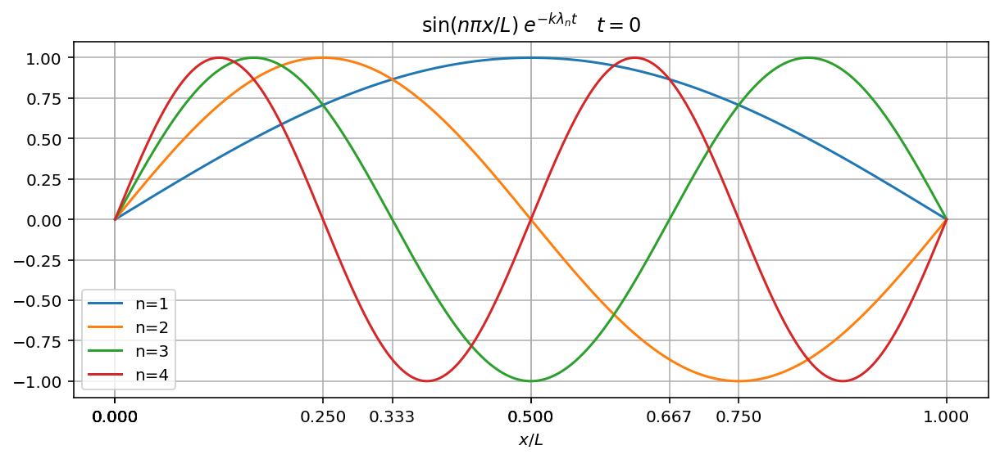

In [8]:
L = 1
k = 1
t = 0.0/k
dx = 0.001
x = np.arange(0, L + dx, dx)

fig, ax = plt.subplots(figsize = (10, 4))

for n in range(1, 5):
    Lambda = (np.pi * n / L)**2
    phi = np.sin(np.sqrt(Lambda) * x)
    ax.plot(x, np.exp(-k * Lambda * t) * phi, label = 'n={:d}'.format(n))
ax.set_xlabel('$x /L$');
ticks = np.sort(np.concatenate([np.arange(0, 2), np.arange(0,2)/2, np.arange(0,3)/3, np.arange(0,4)/4]))
ax.set_xticks(ticks)
ax.grid(True)
ax.set_ylim(-1.1, 1.1)
ax.legend()
ax.set_title(r'$\sin (n\pi x/L) \; e^{-k \lambda_n t} \quad t = 0$')
save_plot('Lecture04/sin2piNLt=0')

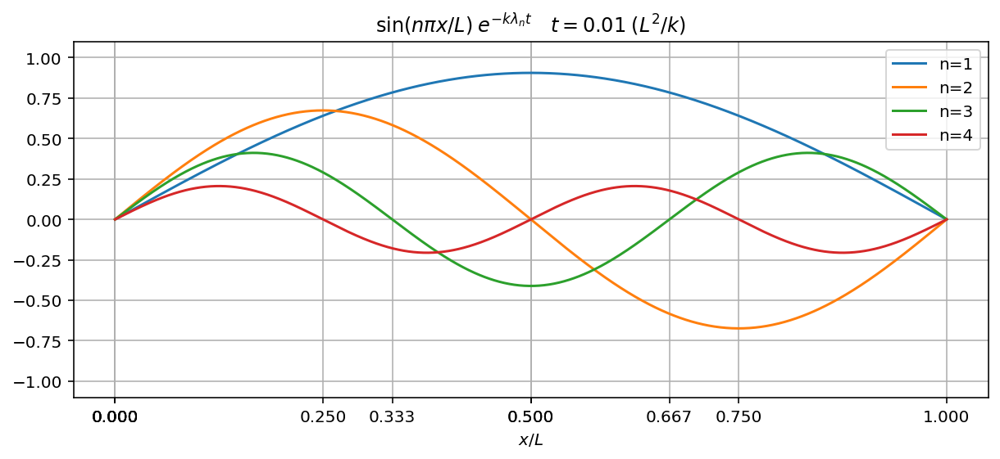

In [9]:
L = 1
k = 1
t = 0.01/k
dx = 0.001
x = np.arange(0, L + dx, dx)

fig, ax = plt.subplots(figsize = (10, 4))

for n in range(1, 5):
    Lambda = (np.pi * n / L)**2
    phi = np.sin(np.sqrt(Lambda) * x)
    ax.plot(x, np.exp(-k * Lambda * t) * phi, label = 'n={:d}'.format(n))
ax.set_xlabel('$x /L$');
ticks = np.sort(np.concatenate([np.arange(0, 2), np.arange(0,2)/2, np.arange(0,3)/3, np.arange(0,4)/4]))
ax.set_xticks(ticks)
ax.grid(True)
ax.set_ylim(-1.1, 1.1)
ax.legend()
ax.set_title(r'$\sin (n\pi x/L) \; e^{-k \lambda_n t} \quad t = 0.01 \;(L^2/k)$')
save_plot('Lecture04/sin2piNLt=0.01')

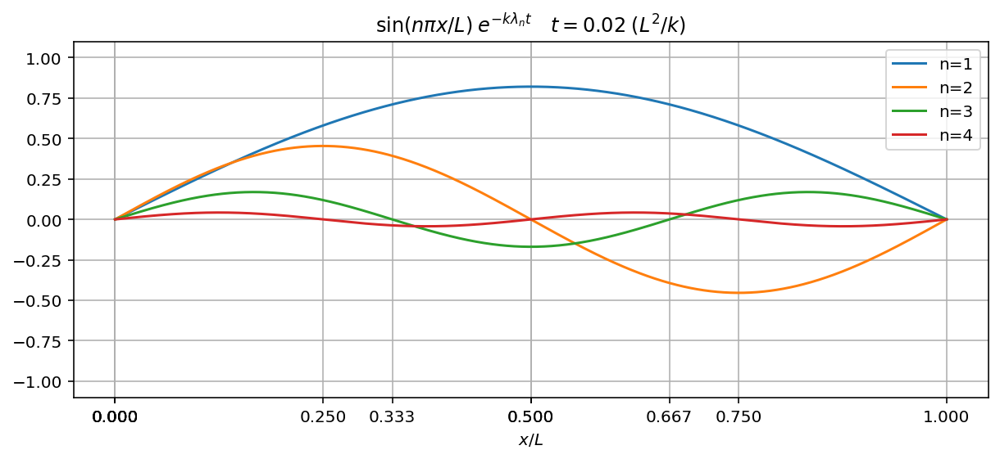

In [10]:
L = 1
k = 1
t = 0.02/k
dx = 0.001
x = np.arange(0, L + dx, dx)

fig, ax = plt.subplots(figsize = (10, 4))

for n in range(1, 5):
    Lambda = (np.pi * n / L)**2
    phi = np.sin(np.sqrt(Lambda) * x)
    ax.plot(x, np.exp(-k * Lambda * t) * phi, label = 'n={:d}'.format(n))
ax.set_xlabel('$x /L$');
ticks = np.sort(np.concatenate([np.arange(0, 2), np.arange(0,2)/2, np.arange(0,3)/3, np.arange(0,4)/4]))
ax.set_xticks(ticks)
ax.grid(True)
ax.set_ylim(-1.1, 1.1)
ax.legend()
ax.set_title(r'$\sin (n\pi x/L) \; e^{-k \lambda_n t} \quad t = 0.02\;(L^2/k)$')
save_plot('Lecture04/sin2piNLt=0.02')

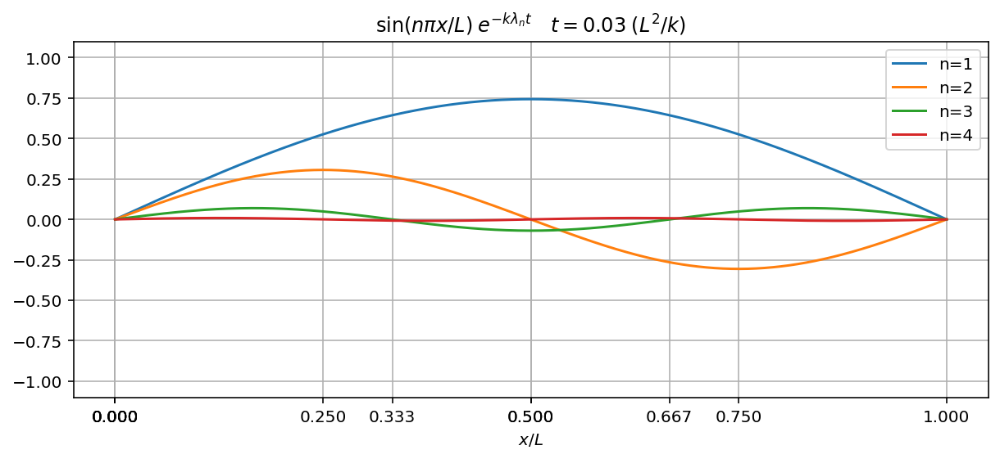

In [11]:
L = 1
k = 1
t = 0.03/k
dx = 0.001
x = np.arange(0, L + dx, dx)

fig, ax = plt.subplots(figsize = (10, 4))

for n in range(1, 5):
    Lambda = (np.pi * n / L)**2
    phi = np.sin(np.sqrt(Lambda) * x)
    ax.plot(x, np.exp(-k * Lambda * t) * phi, label = 'n={:d}'.format(n))
ax.set_xlabel('$x /L$');
ticks = np.sort(np.concatenate([np.arange(0, 2), np.arange(0,2)/2, np.arange(0,3)/3, np.arange(0,4)/4]))
ax.set_xticks(ticks)
ax.grid(True)
ax.set_ylim(-1.1, 1.1)
ax.legend()
ax.set_title(r'$\sin (n\pi x/L) \; e^{-k \lambda_n t} \quad t = 0.03\;(L^2/k)$')
save_plot('Lecture04/sin2piNLt=0.03')

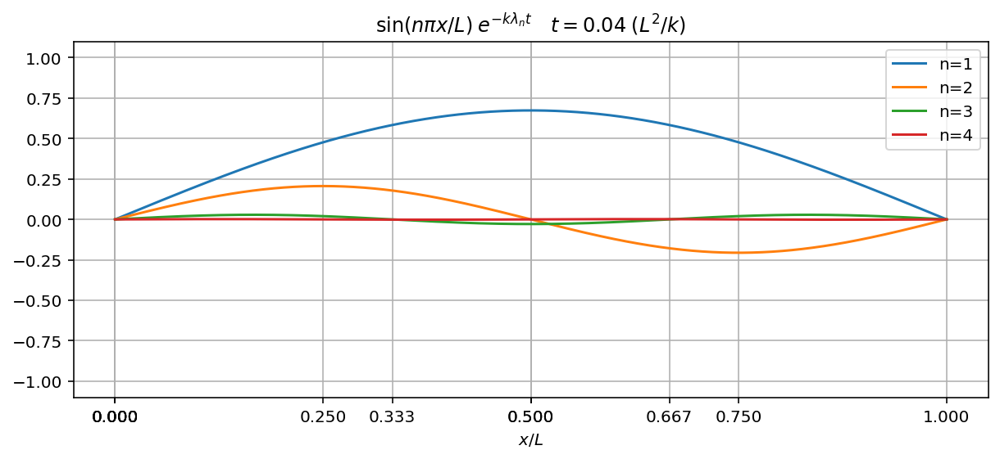

In [12]:
L = 1
k = 1
t = 0.04/k
dx = 0.001
x = np.arange(0, L + dx, dx)

fig, ax = plt.subplots(figsize = (10, 4))

for n in range(1, 5):
    Lambda = (np.pi * n / L)**2
    phi = np.sin(np.sqrt(Lambda) * x)
    ax.plot(x, np.exp(-k * Lambda * t) * phi, label = 'n={:d}'.format(n))
ax.set_xlabel('$x /L$');
ticks = np.sort(np.concatenate([np.arange(0, 2), np.arange(0,2)/2, np.arange(0,3)/3, np.arange(0,4)/4]))
ax.set_xticks(ticks)
ax.grid(True)
ax.set_ylim(-1.1, 1.1)

ax.legend()
ax.set_title(r'$\sin (n\pi x/L) \; e^{-k \lambda_n t} \quad t = 0.04\;(L^2/k)$')
save_plot('Lecture04/sin2piNLt=0.04')

## 4. Gibbs

Add formulas and explanation

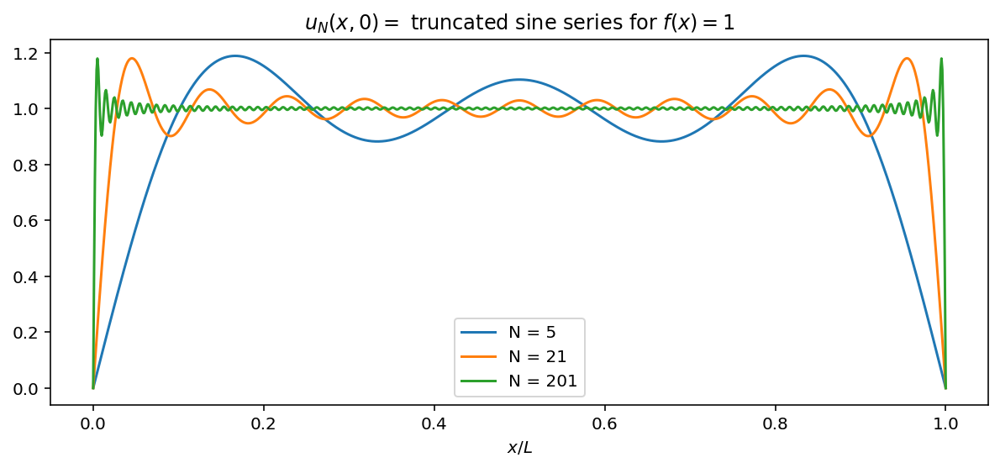

In [16]:
fig, ax = plt.subplots(figsize = (10, 4))

M = 400
Sm = np.full_like(x, 0.0)
for m, n in enumerate(range(1, M + 1, 2)):
    Lambda = (np.pi * n / L)**2
    Bn = 4.0 / (n * np.pi)
    phi_n = np.sin(n * np.pi / L * x)
    Sm += Bn * phi_n  
    if np.in1d(n, [5, 21, 201]):
        ax.plot(x, Sm, label = 'N = {:d}'.format(n))

ax.legend()
ax.set_xlabel('$x /L$');
ax.set_title('$u_N(x, 0) = $ truncated sine series for $f(x) = 1$')
save_plot('Lecture04/ICConverge')

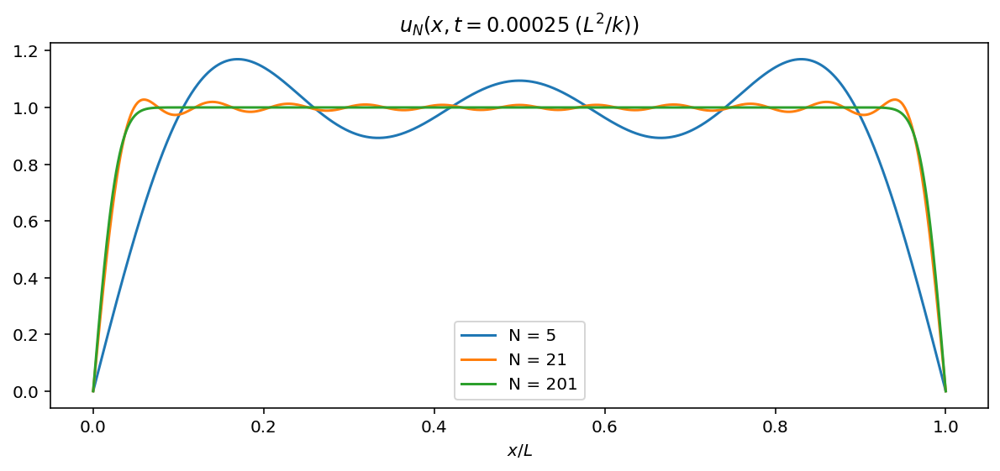

In [21]:
t = 0.00025/k * L**2

fig, ax = plt.subplots(figsize = (10, 4))

M = 400
Sm = np.full_like(x, 0.0)
for m, n in enumerate(range(1, M + 1, 2)):
    Lambda = (np.pi * n / L)**2
    Bn = 4.0 / (n * np.pi)
    phi_n = np.sin(n * np.pi / L * x) * np.exp(-k * Lambda * t)
    Sm += Bn * phi_n
    if np.in1d(n, [5, 21, 201]):
        ax.plot(x, Sm, label = 'N = {:d}'.format(n))

ax.legend()
ax.set_xlabel('$x /L$');
ax.set_title('$u_N(x, t = 0.00025\;(L^2/k))$')

save_plot('Lecture04/SolutionConverge')

In [15]:
# k for Aluminium 97 mm^2/s
L = 304 # mm
k = 97 # Aluminium mm^2/s

0.01 / k * L**2

9.527422680412371

## 5. Midterm figures

### 2021

In [3]:
def f(x):
    return np.exp(x) * (x > 0)

In [2]:
dx = 0.01
x = np.linspace(-3, 3, 300)
x[0] = np.nan
x[-1] = np.nan

y = 2 * ((x/2 - 1/2)%1 - 1/2)

In [4]:
def f_odd(x):
    return (x > 0) * f(x) - (x < 0) * f(-x) 

In [5]:
def f_even(x):
    return (x > 0) * f(x) + (x < 0) * f(-x)

In [7]:
fig, axs = plt.subplots(2, 2, figsize=(7, 7))

axs[0,0].plot(x, f(x))
axs[0,0].plot(x[(x < 1) & (x > -1)], f(x[(x < 1) & (x > -1)]),lw = 3)
axs[0,0].grid()
axs[0,0].set_title('(a)')

axs[0,1].plot(x, f(x)/2)
axs[0,1].plot(x[(x < 1) & (x > -1)], f(x[(x < 1) & (x > -1)])/2,lw = 3)
axs[0,1].grid()
axs[0,1].set_title('Zoom of f(x)/2')
axs[0,1].set_ylim(-1.5,1.5)


axs[1,0].plot(x, (f_even(y)  - np.exp(1) + 1)/2);
axs[1,0].grid()
axs[1,0].set_title('(b)')
axs[1,0].set_ylim(-1.5,1.5)

axs[1,1].plot(x, f_odd(y)/2)
# check derivative
# axs[2].plot(x, np.diff((f_even(y)  - np.exp(1) + 1)/2, prepend=np.nan)/(x[2]-x[1]));
axs[1,1].grid()
axs[1,1].set_title('(c)')
axs[0,1].set_ylim(-1.5,1.5)


#fig_dir = '/Users/tippett/Dropbox/APAM-classes/APMA-3102-2021-Spring/'
#save_plot('Midterm1')

### 2022

In [9]:
def f(x):
    return 1 - x

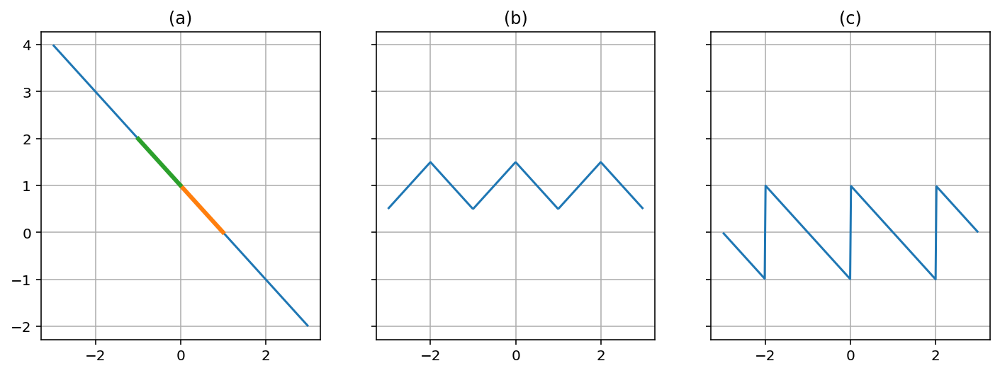

In [26]:
fig, axs = plt.subplots(1, 3, figsize=(12, 4), sharey=True, sharex=True)

ax = axs[0]
ax.plot(x, f(x))
ax.plot(x[(x < 1) & (x > 0)], f(x[(x < 1) & (x > 0)]), lw = 3)
ax.plot(x[(x < 0) & (x > -1)], f(x[(x < 0) & (x > -1)]), lw = 3)
ax.grid()
ax.set_title('(a)')


ax = axs[1]
ax.plot(x, f_even(y) + 1/2);
ax.grid()
ax.set_title('(b)')
#ax.set_ylim(-0.5, 2)

ax = axs[2]
ax.plot(x, f_odd(y))
ax.grid()
ax.set_title('(c)')
#ax.set_ylim(-1.5,1.5)


fig_dir = '/Users/tippett/Dropbox/APAM-classes/APMA-3102-2022-Spring/'
file_name = 'Midterm1'
plt.savefig(fig_dir + file_name + '.pdf', dpi = 300)

## 6. Square drum

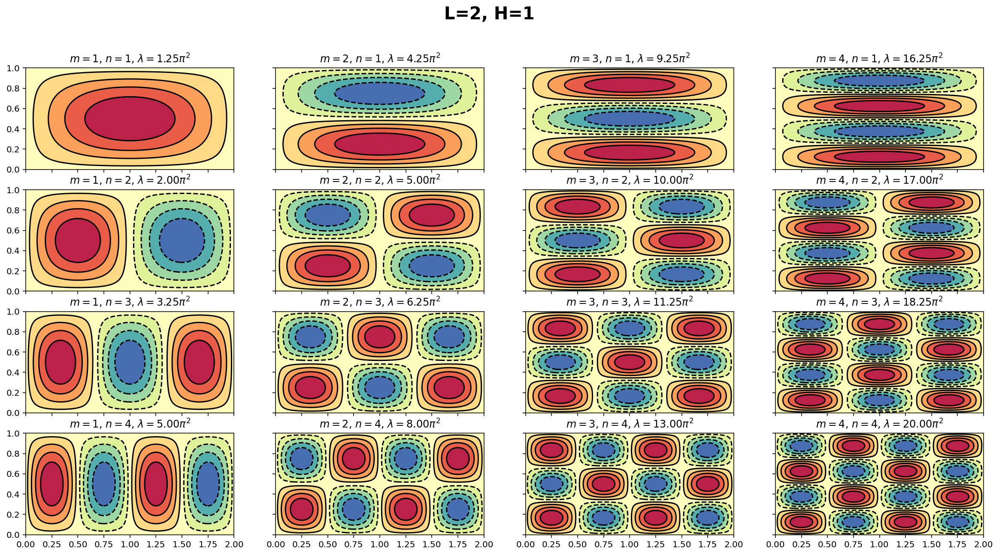

In [36]:
N = 4
M = 4
L = 2
H = 1
nx = 101
x = np.linspace(0, L, nx)
x = x.reshape(nx, 1)
ny = 201
y = np.linspace(0, H, ny)
y = y.reshape(1, ny)

fig, axs = plt.subplots(N, M, figsize=(20, 10), sharex=True, sharey=True)

for m in range(1, M + 1):
    for n in range(1, N + 1):
        Lambda = (n * np.pi / L)**2 + (m * np.pi / H)**2
        phi = np.sin(n * np.pi / L * x) * np.sin(m * np.pi / H * y)
        axs[n - 1, m - 1].contourf(x.flat, y.flat, phi.T, cmap='Spectral_r', levels=np.linspace(-1, 1, 10))
        axs[n - 1, m - 1].contour(x.flat, y.flat, phi.T, colors='k', levels=np.linspace(-1, 1, 10))

        title = '$m = {}$, $n = {}$, $\lambda = {:2.2f}\pi^2$'.format(m, n, Lambda/np.pi**2)
        axs[n - 1, m - 1].set_title(title)
#fig_dir = '/Users/tippett/Library/Mobile Documents/com~apple~CloudDocs/APMA 3102 2021/'
#save_plot('SquareDrum')
fig.suptitle('L=2, H=1', fontsize=20, fontweight='bold');

fig_dir = '/Users/tippett/Dropbox/APAM-classes/APMA-3102-2022-Spring/'
file_name = 'SquareDrum1'
plt.savefig(fig_dir + file_name + '.png')

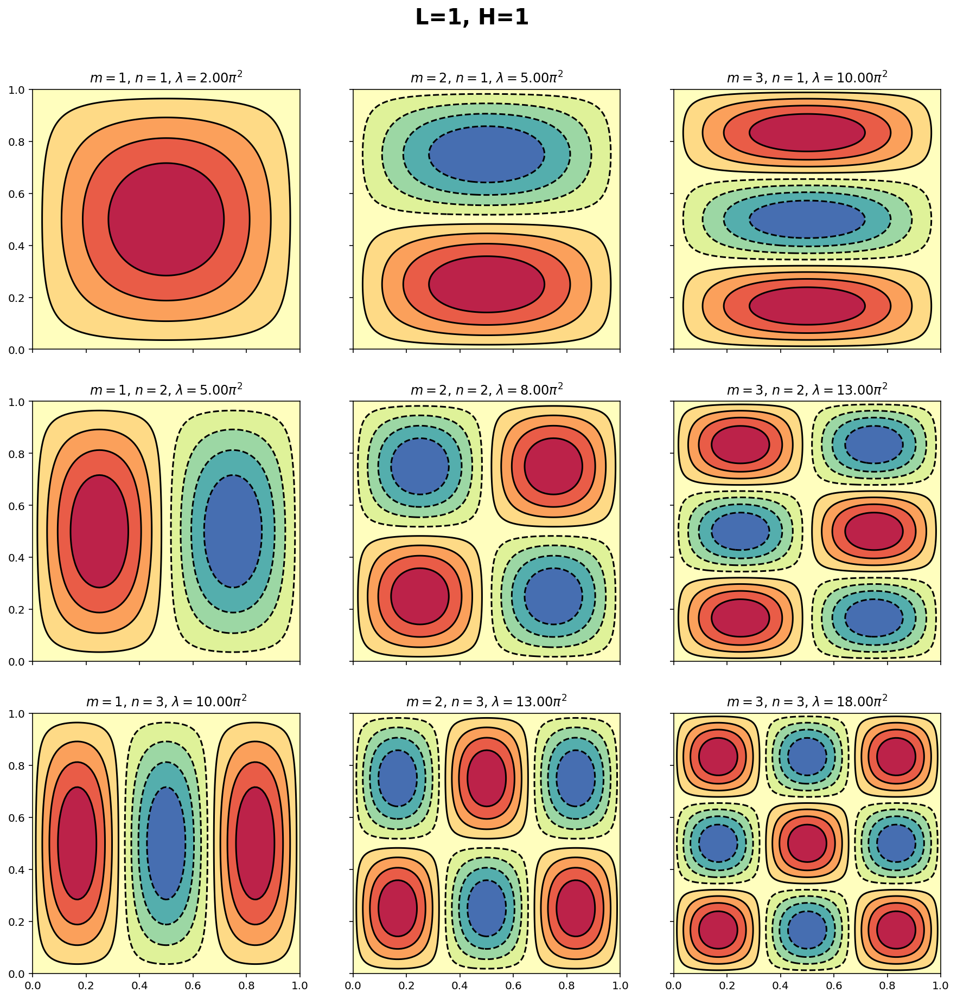

In [37]:
N = 3
M = 3
L = 1
H = 1
nx = 101
x = np.linspace(0, L, nx)
x = x.reshape(nx, 1)
ny = 201
y = np.linspace(0, H, ny)
y = y.reshape(1, ny)

fig, axs = plt.subplots(N, M, figsize=(15, 15), sharex=True, sharey=True)

for m in range(1, M + 1):
    for n in range(1, N + 1):
        Lambda = (n * np.pi / L)**2 + (m * np.pi / H)**2
        phi = np.sin(n * np.pi / L * x) * np.sin(m * np.pi / H * y)
        axs[n - 1, m - 1].contourf(x.flat, y.flat, phi.T, cmap='Spectral_r', levels=np.linspace(-1, 1, 10))
        axs[n - 1, m - 1].contour(x.flat, y.flat, phi.T, colors='k', levels=np.linspace(-1, 1, 10))

        title = '$m = {}$, $n = {}$, $\lambda = {:2.2f}\pi^2$'.format(m, n, Lambda/np.pi**2)
        axs[n - 1, m - 1].set_title(title)
fig.suptitle('L=1, H=1', y=0.95, fontsize=20, fontweight='bold');

fig_dir = '/Users/tippett/Dropbox/APAM-classes/APMA-3102-2022-Spring/'
file_name = 'SquareDrum2'
plt.savefig(fig_dir + file_name + '.png')

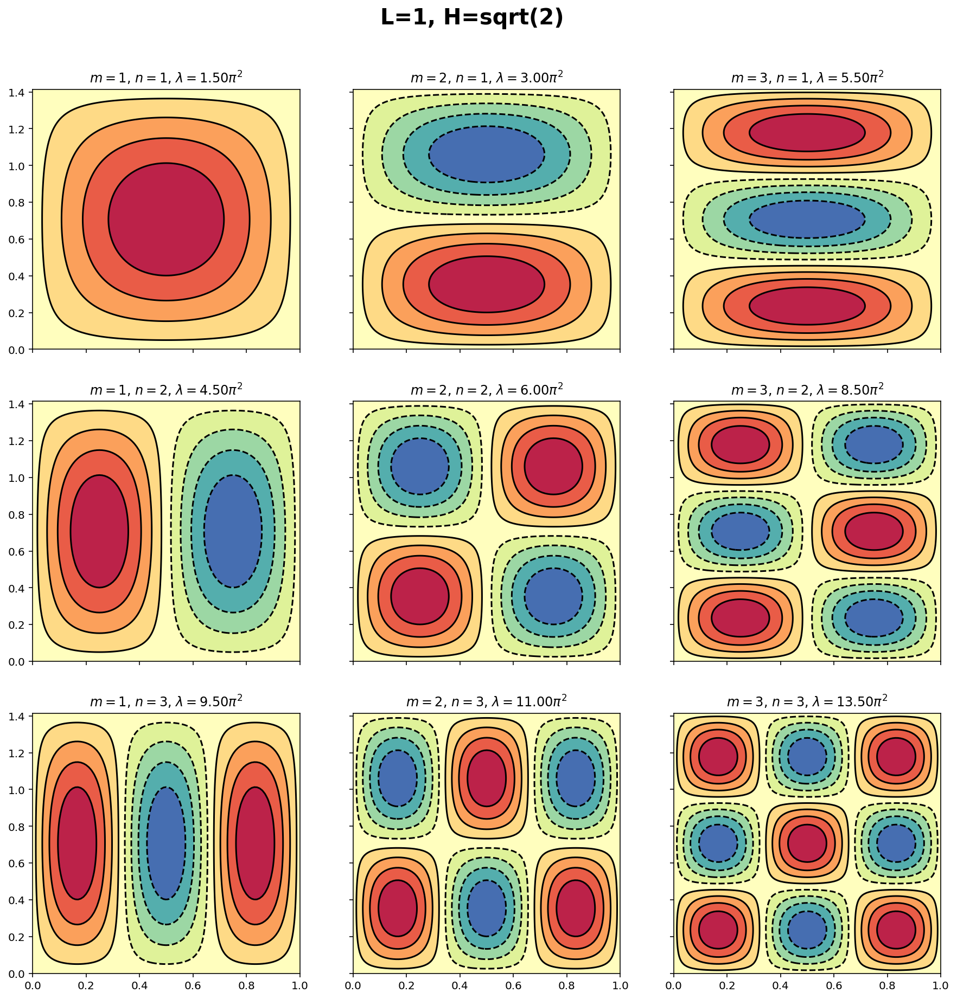

In [38]:
N = 3
M = 3
L = 1
H = np.sqrt(2)
nx = 101
x = np.linspace(0, L, nx)
x = x.reshape(nx, 1)
ny = 201
y = np.linspace(0, H, ny)
y = y.reshape(1, ny)

fig, axs = plt.subplots(N, M, figsize=(15, 15), sharex=True, sharey=True)

for m in range(1, M + 1):
    for n in range(1, N + 1):
        Lambda = (n * np.pi / L)**2 + (m * np.pi / H)**2
        phi = np.sin(n * np.pi / L * x) * np.sin(m * np.pi / H * y)
        axs[n - 1, m - 1].contourf(x.flat, y.flat, phi.T, cmap='Spectral_r', levels=np.linspace(-1, 1, 10))
        axs[n - 1, m - 1].contour(x.flat, y.flat, phi.T, colors='k', levels=np.linspace(-1, 1, 10))

        title = '$m = {}$, $n = {}$, $\lambda = {:2.2f}\pi^2$'.format(m, n, Lambda/np.pi**2)
        axs[n - 1, m - 1].set_title(title)
fig.suptitle('L=1, H=sqrt(2)', y=0.95, fontsize=20, fontweight='bold');

fig_dir = '/Users/tippett/Dropbox/APAM-classes/APMA-3102-2022-Spring/'
file_name = 'SquareDrum3'
plt.savefig(fig_dir + file_name + '.png')

## 7. Bessel functions and round drum

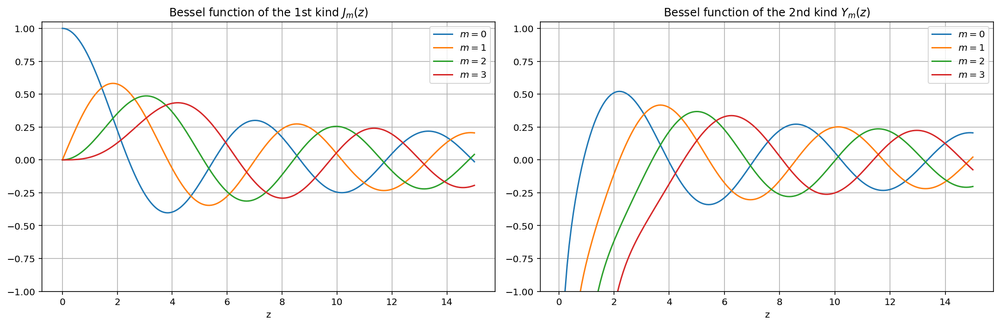

In [48]:
from scipy.special import jv as Jm
from scipy.special import yv as Ym

z = np.linspace(0, 15, 200)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

ax = axs[0]
for m in range(0, 4):
    ax.plot(z, Jm(m, z), label='$m = {}$'.format(m))
    #ax.plot(z, np.sqrt(2/np.pi/z)*np.cos(z - m*np.pi/2 - np.pi/4), 'k')

ax.set_title('Bessel function of the 1st kind $J_m(z)$')
ax.set_xlabel('z')
ax.set_ylim(-1, 1.05)
ax.grid()
ax.legend();

ax = axs[1]
for m in range(0, 4):
    ax.plot(z, Ym(m, z), label='$m = {}$'.format(m))
ax.set_title('Bessel function of the 2nd kind $Y_m(z)$')
ax.set_xlabel('z')
ax.set_ylim(-1, 1.05)
ax.grid()
ax.legend();

fig.tight_layout()

#save_plot('BesselJYz')
fig_dir = '/Users/tippett/Dropbox/APAM-classes/APMA-3102-2022-Spring/'
file_name = 'Bessel1'
plt.savefig(fig_dir + file_name + '.png')

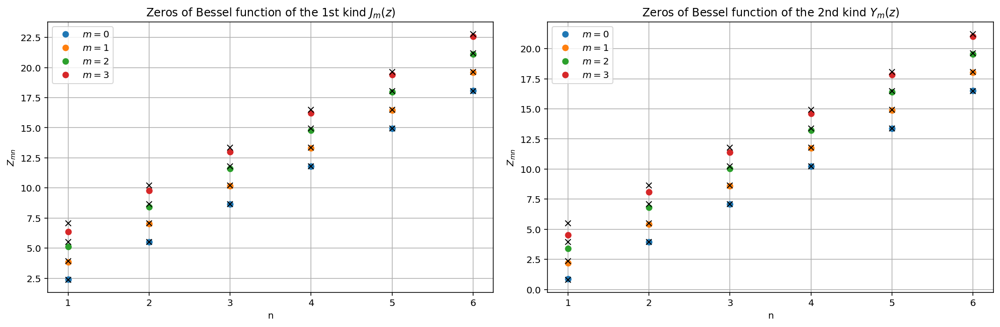

In [50]:
from scipy.special import jn_zeros
from scipy.special import yn_zeros

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

mmax = 6
ms = np.arange(1, mmax + 1)

ax = axs[0]
for m in range(0, 4):
    ax.plot(ms, jn_zeros(m, mmax), 'o', label='$m = {}$'.format(m))
    ax.plot(ms, 3*np.pi/4 + m*np.pi/2 + (ms-1)*np.pi, 'kx')

ax.set_title('Zeros of Bessel function of the 1st kind $J_m(z)$')
ax.set_xlabel('n')
ax.set_ylabel('$Z_{mn}$')
ax.grid()
ax.legend();

ax = axs[1]
for m in range(0, 4):
    ax.plot(np.arange(1, mmax + 1), yn_zeros(m, mmax), 'o', label='$m = {}$'.format(m))
    ax.plot(ms, np.pi/4 + m*np.pi/2 + (ms-1)*np.pi, 'kx')
    
ax.set_title('Zeros of Bessel function of the 2nd kind $Y_m(z)$')
ax.set_xlabel('n')
ax.set_ylabel('$Z_{mn}$')
ax.grid()
ax.legend();

fig.tight_layout()

#save_plot('BesselZeros')
fig_dir = '/Users/tippett/Dropbox/APAM-classes/APMA-3102-2022-Spring/'
file_name = 'BesselZeros'
plt.savefig(fig_dir + file_name + '.png')

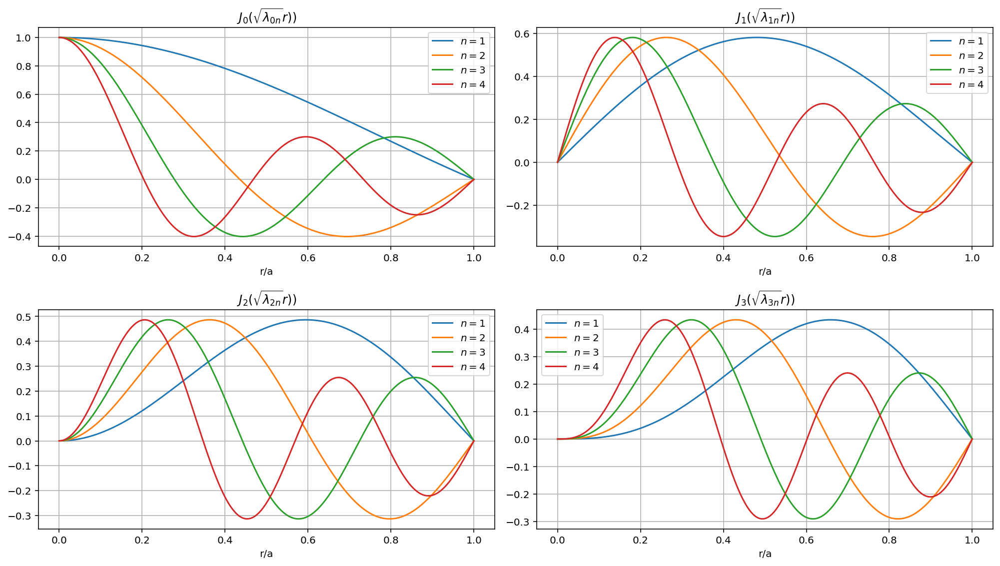

In [52]:
from scipy.special import jv as Jm
from scipy.special import jn_zeros

a = 1
r = np.linspace(0, a, 200)

fig, axs = plt.subplots(2, 2, figsize=(14, 8))

axs = axs.reshape(4,)

nmax = 4
for m in range(0, 4):
    ax = axs[m]
    Z_mn = jn_zeros(m, nmax)
    for n in range(0, nmax):
        Lambda = (Z_mn[n] / a)**2
        z = r * np.sqrt(Lambda)
        ax.plot(r, Jm(m, z), label='$n = {}$'.format(n + 1))
    bstr = '{}'.format(m)
    title = '$J_%d (\sqrt{\lambda_{%dn}} r) )$' % (m, m)
    ax.set_title(title)
    ax.set_xlabel('r/a')
    ax.grid()
    ax.legend();

fig.tight_layout()

#save_plot('BesselJr')
fig_dir = '/Users/tippett/Dropbox/APAM-classes/APMA-3102-2022-Spring/'
file_name = 'Bessel2'
plt.savefig(fig_dir + file_name + '.png')

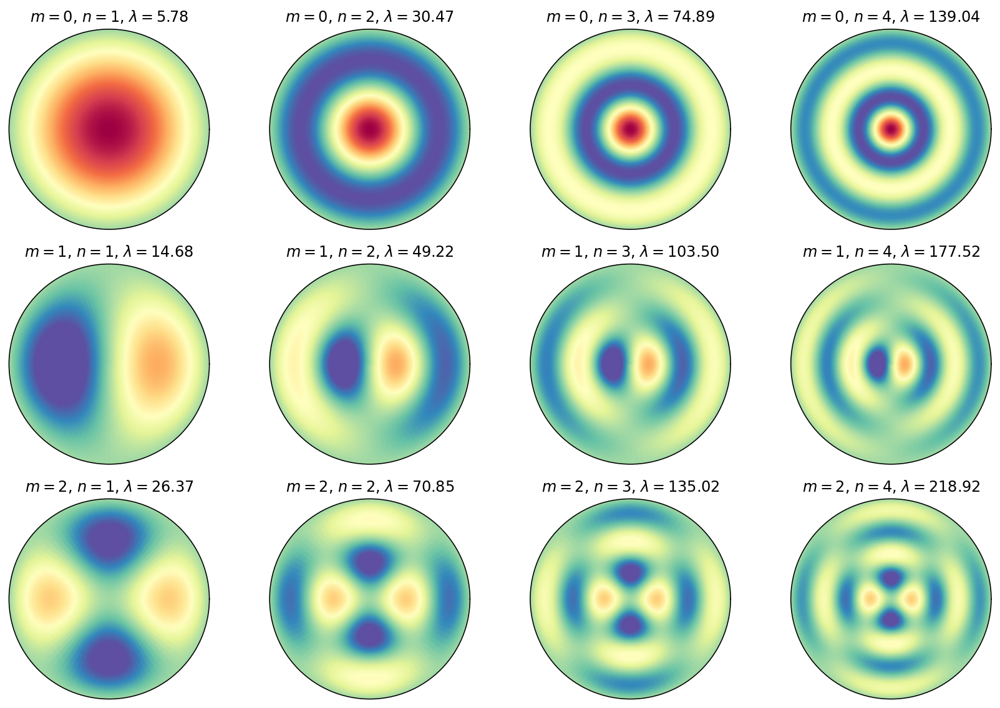

In [53]:
from scipy.special import jv as Jm

a = 1
R = np.linspace(0, a, 100)
Theta = np.linspace(-np.pi, np.pi, 100)
r, theta = np.meshgrid(R, Theta)

mmax = 3
nmax = 4

fig, axs = plt.subplots(mmax, nmax, figsize=(12, 8), subplot_kw=dict(projection='polar'))

for m in range(0, mmax):
    for n in range(0, nmax):
        Z_mn = jn_zeros(m, nmax)
        Lambda = (Z_mn[n] / a)**2
        z = r * np.sqrt(Lambda)
        values= Jm(m, z) * np.cos(m*theta)
        ax = axs[m, n]
        g = ax.pcolormesh(theta, r, values, cmap='Spectral_r', vmin=-0.4, vmax=1, shading='gouraud')
        #ax.contour(theta, r, values, colors='k')

        ax.set_yticks(())
        ax.set_xticks(());
        title = '$m = {}$, $n = {}$, $\lambda = {:2.2f}$'.format(m, n+1, Lambda)
        ax.set_title(title)


fig.tight_layout()

#save_plot('BesselFourier')
fig_dir = '/Users/tippett/Dropbox/APAM-classes/APMA-3102-2022-Spring/'
file_name = 'BesselFourier'
plt.savefig(fig_dir + file_name + '.png')

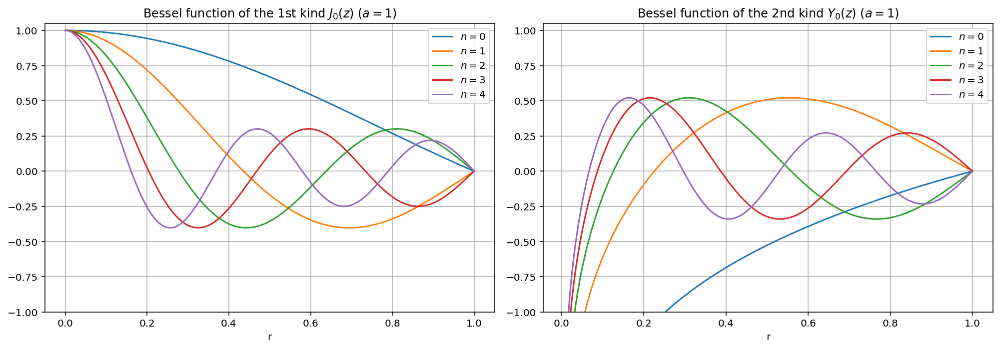

In [47]:
from scipy.special import jv as Jm
from scipy.special import yv as Ym
from scipy.special import jn_zeros
from scipy.special import yn_zeros


a = 1
r = np.linspace(0, a, 200)

fig, axs = plt.subplots(1, 2, figsize=(14, 5))

m = 0
nmax = 5

Z_mn = jn_zeros(m, nmax)
ax = axs[0]
for n in range(0, nmax):
    z = r * Z_mn[n] / a
    ax.plot(r, Jm(m, z), label='$n = {}$'.format(n))
ax.set_title('Bessel function of the 1st kind $J_0(z)$ ($a = 1$)')
ax.set_xlabel('r')
ax.set_ylim(-1, 1.05)
ax.grid()
ax.legend();

Z_mn = yn_zeros(m, nmax)
ax = axs[1]
for n in range(0, nmax):
    z = r * Z_mn[n] / a
    ax.plot(r, Ym(m, z), label='$n = {}$'.format(n))
ax.set_title('Bessel function of the 2nd kind $Y_0(z)$ ($a = 1$)')
ax.set_xlabel('r')
ax.set_ylim(-1, 1.05)
ax.grid()
ax.legend();

fig.tight_layout()

#save_plot('BesselJYr')

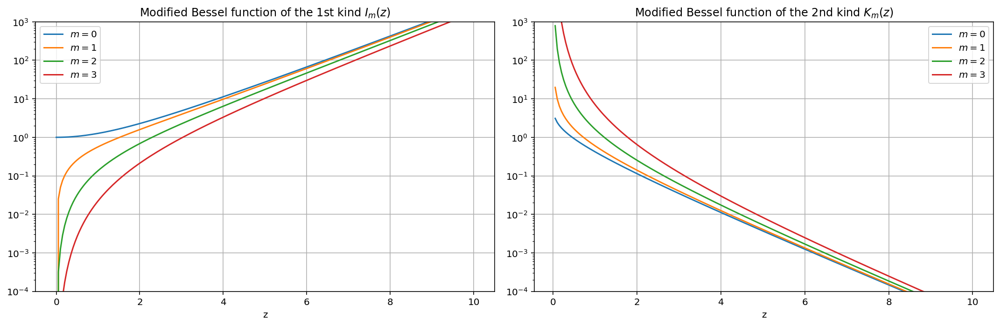

In [28]:
from scipy.special import iv as Im
from scipy.special import kv as Km

z = np.linspace(0, 10, 200)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

ax = axs[0]
for m in range(0, 4):
    ax.plot(z, Im(m, z), label='$m = {}$'.format(m))
    #ax.plot(z, np.sqrt(2/np.pi/z)*np.cos(z - m*np.pi/2 - np.pi/4), 'k')

ax.set_title('Modified Bessel function of the 1st kind $I_m(z)$')
ax.set_xlabel('z')
ax.set_ylim(1e-4, 1000)
ax.set_yscale('log')
ax.grid()
ax.legend();

ax = axs[1]
for m in range(0, 4):
    ax.plot(z, Km(m, z), label='$m = {}$'.format(m))
ax.set_title('Modified Bessel function of the 2nd kind $K_m(z)$')
ax.set_xlabel('z')
ax.set_ylim(1e-4, 1000)
ax.set_yscale('log')
ax.grid()
ax.legend();

fig.tight_layout()

save_plot('ModifiedBesselIKz')

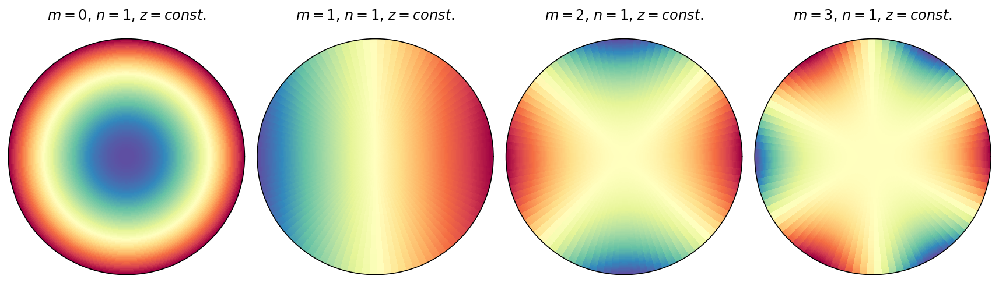

In [29]:
a = 0.1
H = 1
R = np.linspace(0, a, 100)
Theta = np.linspace(-np.pi, np.pi, 100)
r, theta = np.meshgrid(R, Theta)

mmax = 4
nmax = 1

fig, axs = plt.subplots(nmax, mmax, figsize=(12, 8), subplot_kw=dict(projection='polar'))

for m in range(0, mmax):
    for n in range(1, nmax + 1):
        values= Im(m, n*np.pi*r/H) * np.cos(m*theta)
        ax = axs[m]
        g = ax.pcolormesh(theta, r, values, cmap='Spectral_r')
        #ax.contour(theta, r, values, colors='k')

        ax.set_yticks(())
        ax.set_xticks(());
        title = '$m = {}$, $n = {}$, $z= const.$'.format(m, n)
        ax.set_title(title)

fig.tight_layout()

save_plot('ModifiedBesselFourierSlice')

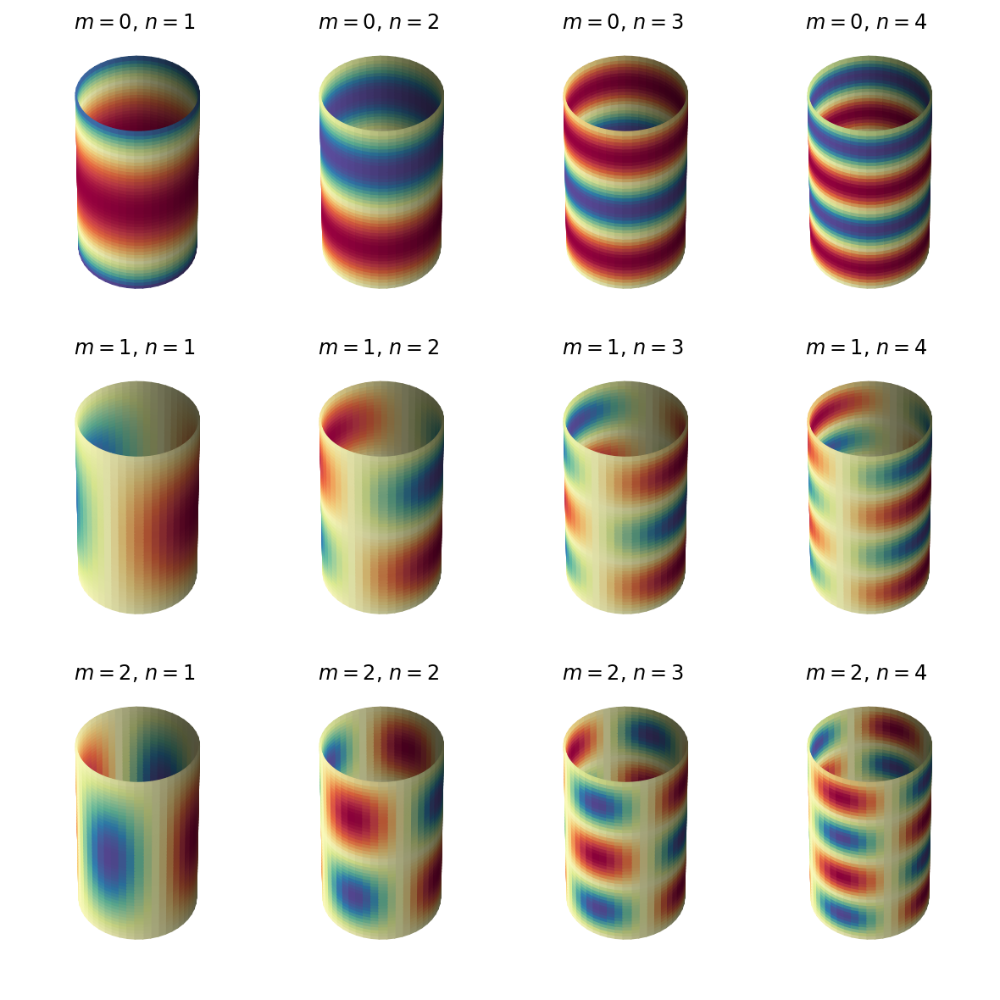

In [30]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm, colors

H = 1
R = 3

theta = np.linspace(0, 2*np.pi, 50) + np.pi
z = np.linspace(0, H, 50)

Theta, Z = np.meshgrid(theta, z)
X = R * np.cos(Theta)
Y = R * np.sin(Theta)

mmax = 3
nmax = 4
figsize=plt.figaspect(1.)
fig, axs = plt.subplots(mmax, nmax, figsize=(8, 8), tight_layout={'pad': 0}, subplot_kw=dict(projection='3d'))

for m in range(0, mmax):
    for n in range(1, nmax + 1):
        ax = axs[m, n - 1]
        fcolors = Im(m, n*np.pi*R/H) * np.cos(m*Theta) * np.sin(n*np.pi*Z/H)
        #fcolors = np.cos(Theta)
        fmax, fmin = fcolors.max(), fcolors.min()
        fcolors = (fcolors - fmin)/(fmax - fmin)
        ax.plot_surface(X, Y, Z, facecolors=cm.Spectral_r(fcolors))
        ax.set_axis_off()
        title = '$m = {}$, $n = {}$'.format(m, n)
        ax.set_title(title)

fig.tight_layout()

save_plot('ModifiedBesselFourier3D')

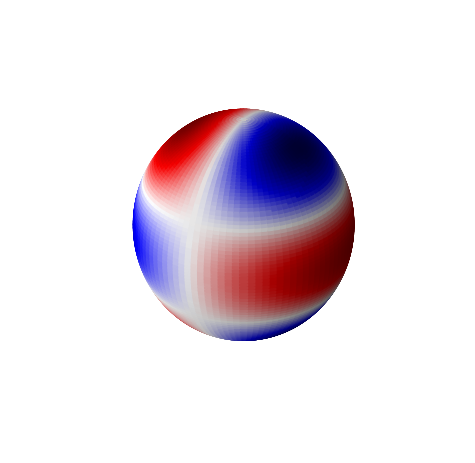

In [31]:
from scipy.special import sph_harm

phi = np.linspace(0, np.pi, 100)
theta = np.linspace(0, 2*np.pi, 100)
phi, theta = np.meshgrid(phi, theta)

# The Cartesian coordinates of the unit sphere
x = np.sin(phi) * np.cos(theta)
y = np.sin(phi) * np.sin(theta)
z = np.cos(phi)

m, l = 1, 3

# Calculate the spherical harmonic Y(l,m) and normalize to [0,1]
fcolors = sph_harm(m, l, theta, phi).real
fmax, fmin = fcolors.max(), fcolors.min()
fcolors = (fcolors - fmin)/(fmax - fmin)

# Set the aspect ratio to 1 so our sphere looks spherical
fig = plt.figure(figsize=plt.figaspect(1.))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x, y, z,  rstride=1, cstride=1, facecolors=cm.seismic(fcolors))
# Turn off the axis planes
ax.set_axis_off()
plt.show()

/Users/tippett/miniconda3/envs/pangeo/lib/python3.6/site-packages/cartopy/mpl/geoaxes.py:1366: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)


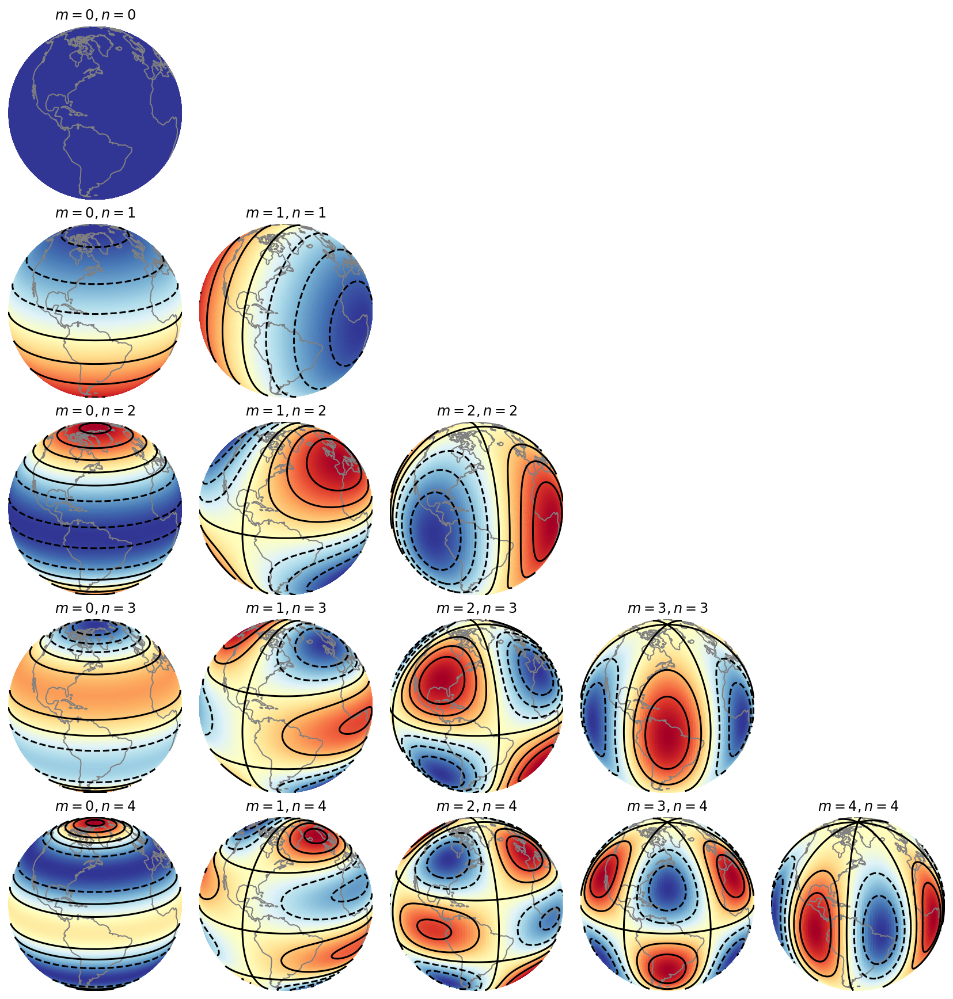

In [32]:
import numpy as np
import scipy.special as sp
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs

lon = np.linspace(0, 2*np.pi, 200) - np.pi
lat = np.linspace(-np.pi/2, np.pi/2, 500)
colat = lat + np.pi/2
X, Y = np.meshgrid(lon, colat)

# Compute spherical harmonic pattern

#Set up figure
map_proj = ccrs.Orthographic(-60, 20)
fig, axs = plt.subplots(5, 5, figsize=(12, 12), tight_layout={'pad': 0.5}, 
                        subplot_kw = {'projection': map_proj})

for l in range(0, 5):
    for m in range(0, l + 1):

        d = sp.sph_harm(m, l, X, Y).real
        ax = axs[l, m]
        ax.pcolormesh(lon*180/np.pi, lat*180/np.pi, d, transform=ccrs.PlateCarree(),
                        cmap='RdYlBu_r')
        ax.contour(lon*180/np.pi, lat*180/np.pi, d, transform=ccrs.PlateCarree(), colors='k')
        ax.coastlines(color='gray')
        ax.set_title('$m={}, n={}$'.format(m, l))

for l in range(0, 5):
    for m in range(0, 5):        
        ax = axs[l, m]
        ax.background_patch.set_visible(False)
        ax.outline_patch.set_visible(False)

save_plot('SphericalHarmonics')

In [33]:
laplacian_ds = xr.open_dataset('http://iridl.ldeo.columbia.edu/home/.tippett/.Laplacian/.CONUS_1x1/.conus_Y/dods')
laplacian_ds.conus_Y.shape

(860, 26, 71)

/Users/tippett/miniconda3/envs/pangeo/lib/python3.6/site-packages/xarray/plot/facetgrid.py:373: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  self.fig.tight_layout()


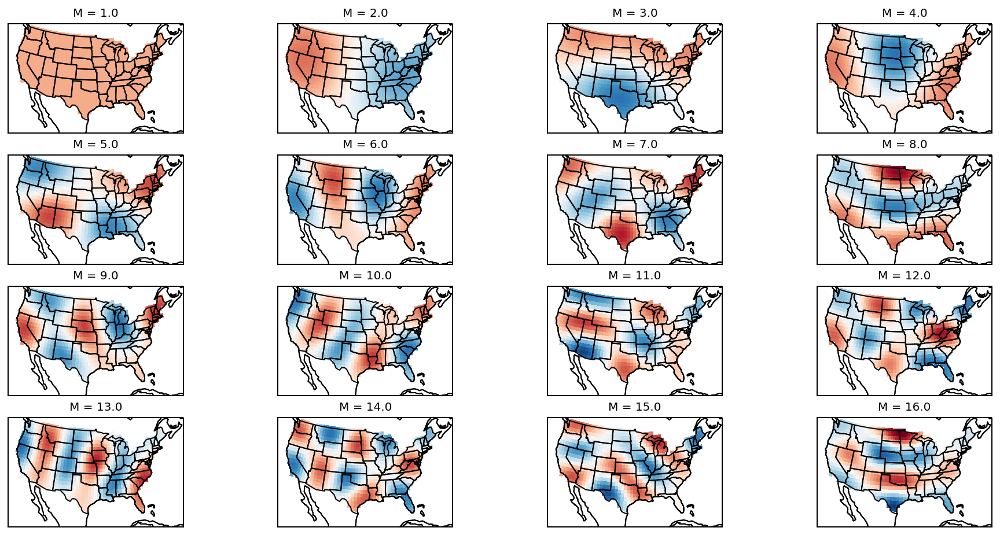

In [34]:
lap = laplacian_ds.conus_Y[0:16]
ds = laplacian_ds

extent = [-120, -70, 20, 50.5]


# This is the map projection we want to plot *onto*
proj_map = ccrs.LambertConformal(central_longitude=-95, central_latitude=45)
proj_dta = ccrs.PlateCarree()  # the data's projection
p = lap.plot(transform = proj_dta,  # the data's projection
             col='M', col_wrap= 4,  # multiplot settings
             figsize=(16, 8),
             add_colorbar=False,
             aspect=ds.dims['X'] / ds.dims['Y'],  # for a sensible figsize
             subplot_kws={'projection': proj_map})  # the plot's projection
for ii, ax in enumerate(p.axes.flat):
    ax.coastlines()    
    ax.add_feature(cfeature.STATES)
    ax.coastlines()
    ax.set_extent(extent)
    
save_plot('LaplacianEigenfunctionsCONUS')

## 8. Green's functions

In [35]:
def G(x, y, L):
    return ((y - L)/L * x) * (x <= y) + ((x - L)/L * y) * (x > y) 

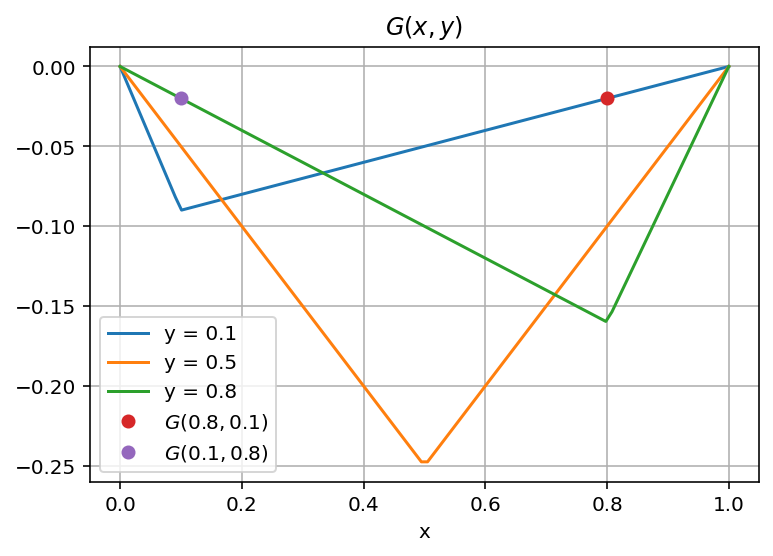

In [36]:
L = 1
N = 100
x = np.linspace(0, L, N)
ys = np.array([0.1, 0.5, 0.8])

for y in ys:
    plt.plot(x, G(x, y, L), label='y = {}'.format(y))

plt.plot(0.8, G(0.8, 0.1, L), 'o', label='$G(0.8,0.1)$')
plt.plot(0.1, G(0.1, 0.8, L), 'o', label='$G(0.1,0.8)$')


plt.xlabel('x')
plt.title('$G(x, y)$')
plt.grid()
plt.legend();

save_plot('DxxGreensFunction')

## 9. Method of characteristics

### 9.1 Linear

In [37]:
def P(x):
    return np.exp(-x**2)

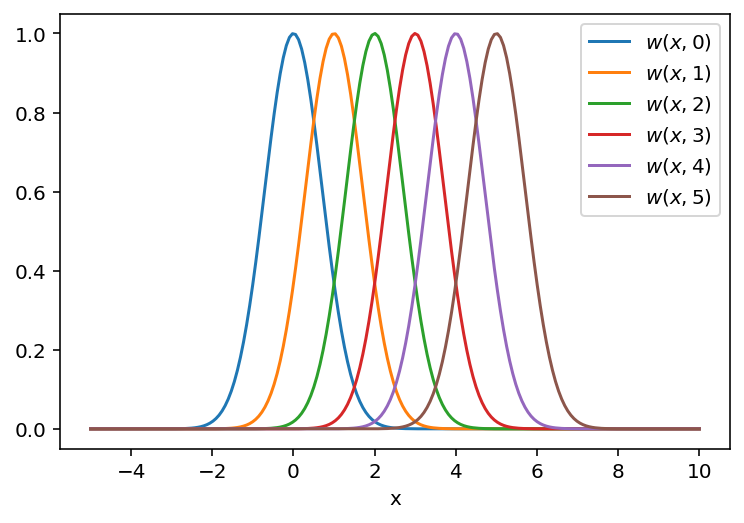

In [38]:
nx = 200
nt = 100
c = 1
x = np.linspace(-5, 10, nx)
t = np.linspace(0, 5, nt)
X, T = np.meshgrid(x, t)
for ii in range(0, 6):
    plt.plot(x, P(x - c*ii), label='$w(x, {})$'.format(ii));
plt.legend();
plt.xlabel('x')
save_plot('Char_w1')

/Users/tippett/miniconda3/envs/pangeo/lib/python3.6/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


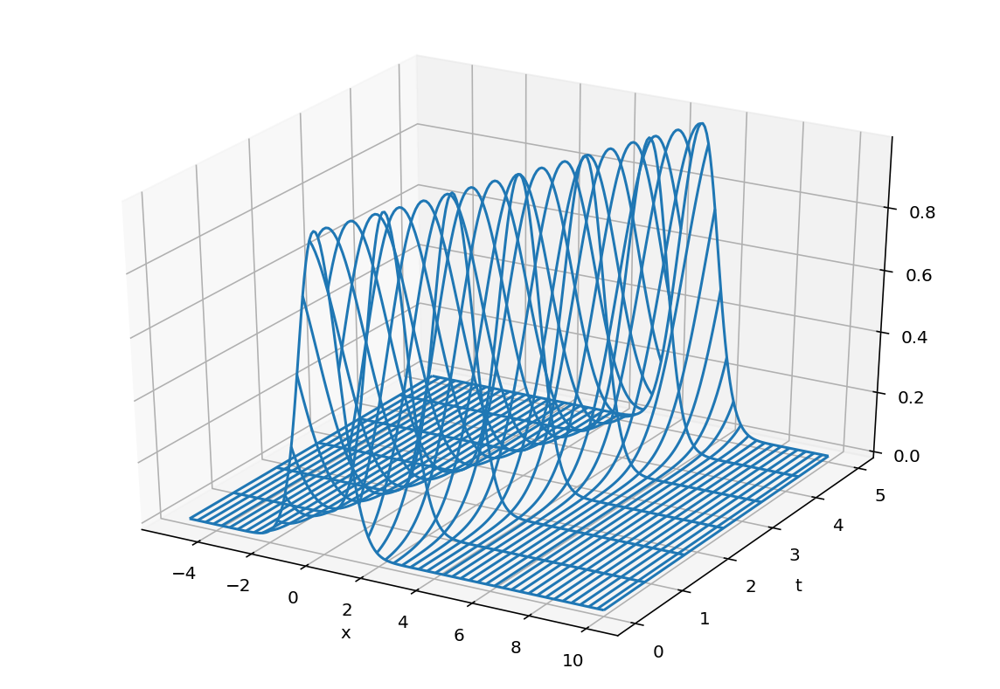

In [39]:
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(projection='3d')

w = P(X - c * T)
# Plot a basic wireframe.
ax.plot_wireframe(X, T, w, rcount=6);
ax.set_xlabel('x')
ax.set_ylabel('t')
save_plot('Char_w2')

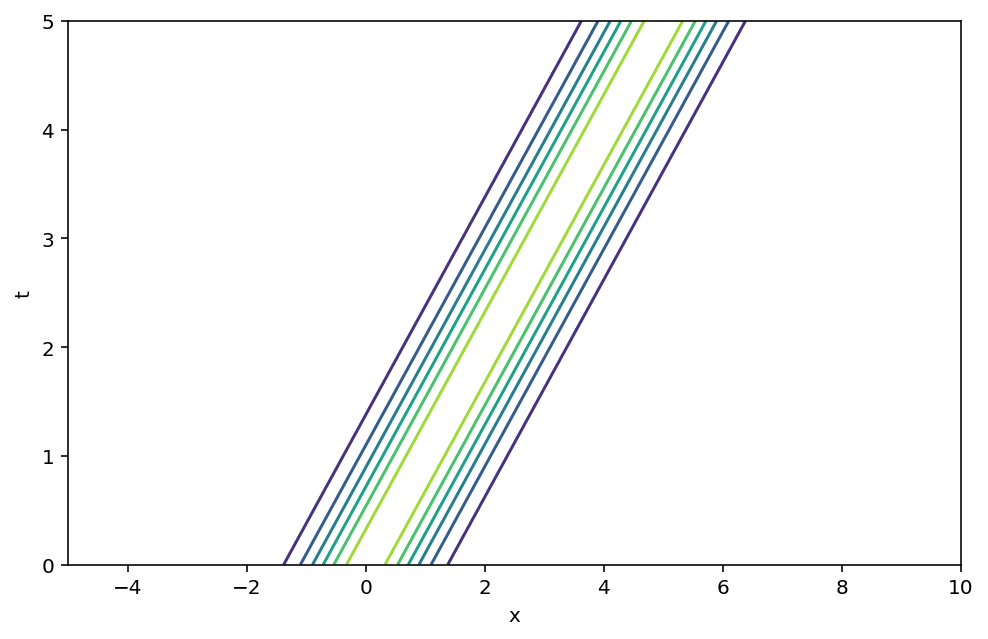

In [40]:
fig, ax = plt.subplots(figsize=(8, 5))
ax.contour(X, T, w)
ax.set_xlabel('x')
ax.set_ylabel('t')
save_plot('Char_w3')

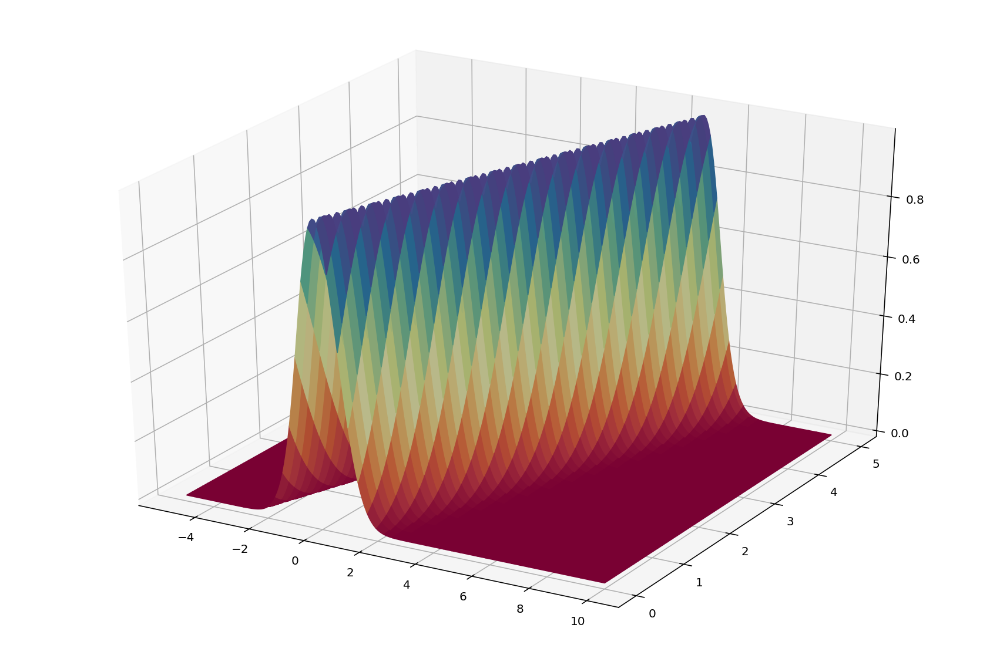

In [41]:
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(projection='3d')

w = P(X - c * T)
# Plot a basic wireframe.
fcolors = (w - np.mean(w))/np.max(w)
ax.plot_surface(X, T, w, facecolors=cm.Spectral(w))

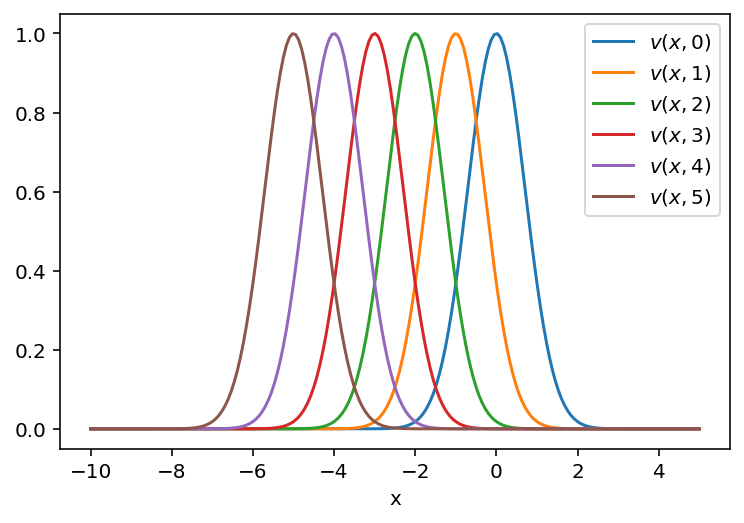

In [42]:
nx = 200
nt = 100
c = 1
x = np.linspace(-10, 5, nx)
t = np.linspace(0, 5, nt)
X, T = np.meshgrid(x, t)
for ii in range(0, 6):
    plt.plot(x, P(x + c*ii), label='$v(x, {})$'.format(ii));
plt.legend();
plt.xlabel('x')
save_plot('Char_v1')

/Users/tippett/miniconda3/envs/pangeo/lib/python3.6/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


Text(0.5, 0, 't')

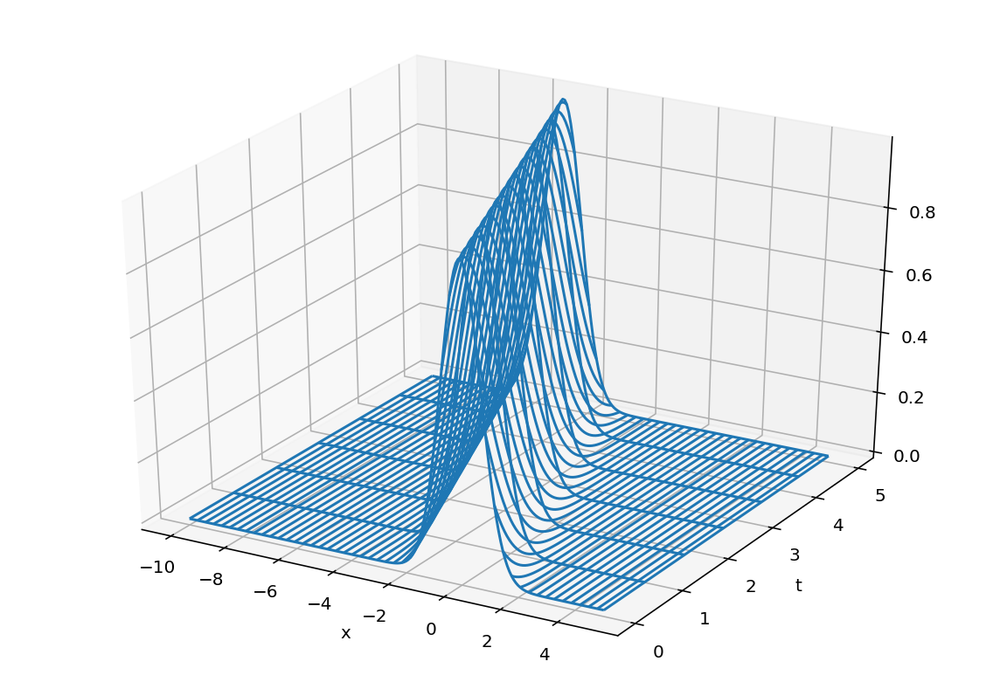

In [43]:
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(projection='3d')

w = P(X + c * T)
# Plot a basic wireframe.
ax.plot_wireframe(X, T, w, rcount=6);
ax.set_xlabel('x')
ax.set_ylabel('t')

Text(0, 0.5, 't')

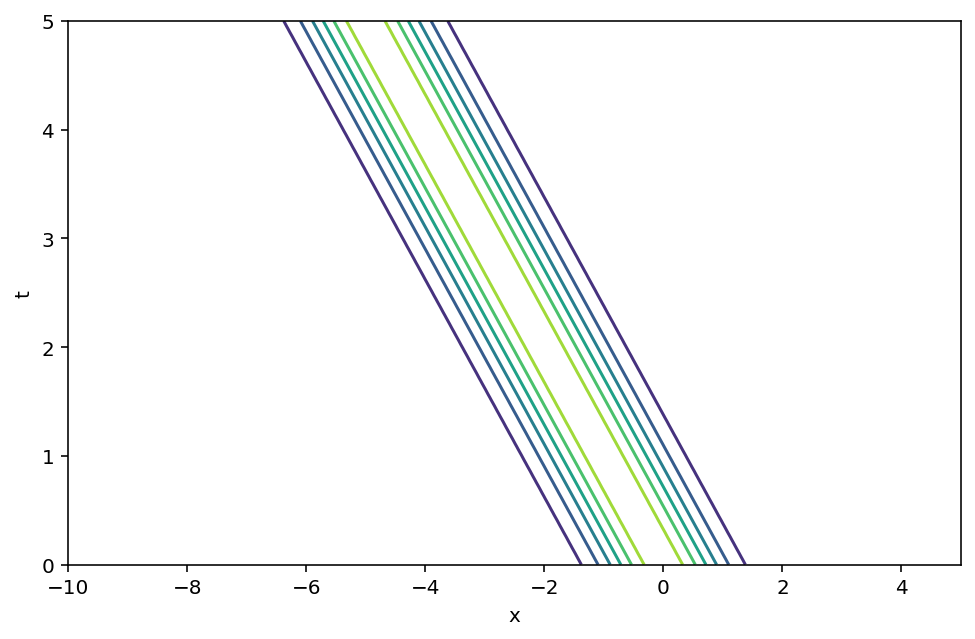

In [44]:
fig, ax = plt.subplots(figsize=(8, 5))
ax.contour(X, T, w)
ax.set_xlabel('x')
ax.set_ylabel('t')

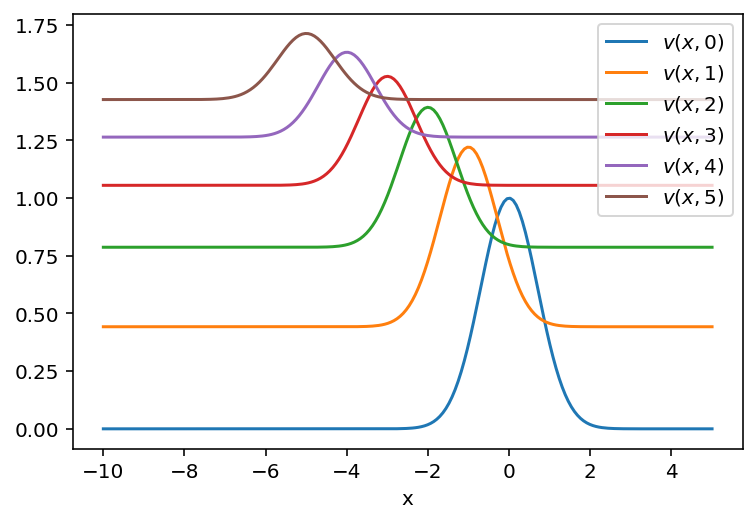

In [45]:
alpha = 0.25
beta = 2 * alpha
nx = 200
nt = 100
c = 1
x = np.linspace(-10, 5, nx)
t = np.linspace(0, 5, nt)
X, T = np.meshgrid(x, t)
for ii in range(0, 6):
    tt = ii
    vxt = beta/alpha * (1 - np.exp(-alpha * tt)) + P(x + c*tt)*np.exp(-alpha * tt)
    plt.plot(x, vxt, label='$v(x, {})$'.format(ii));
plt.legend(loc='upper right');
plt.xlabel('x');
save_plot('Char_ex2')

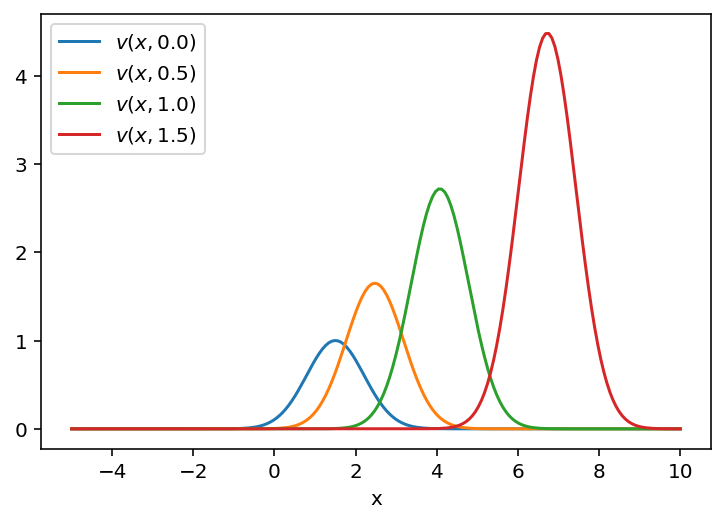

In [46]:
nx = 200
nt = 100
c = 1
x = np.linspace(-5, 10, nx)
for ii in np.arange(0, 2, 0.5):
    tt = ii
    vxt = P(x - 3/2*np.exp(tt))*np.exp(tt)
    plt.plot(x, vxt, label='$v(x, {})$'.format(ii));
plt.legend(loc='upper left');
plt.xlabel('x');
#plt.xscale('log')
save_plot('Char_ex3')

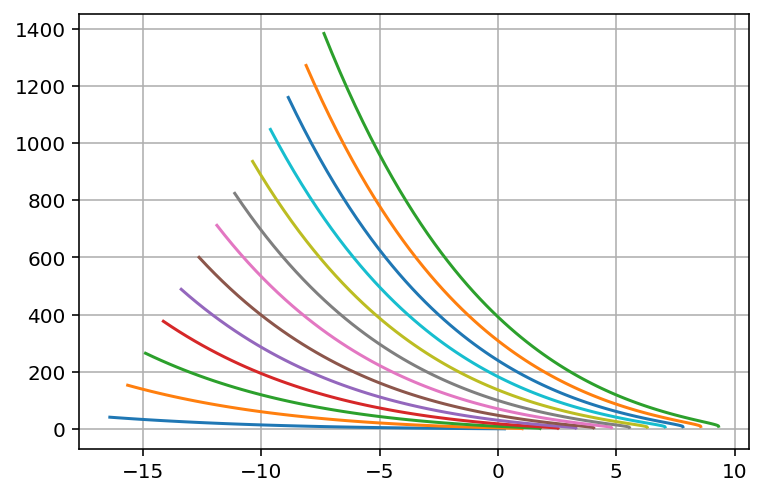

In [47]:
X, T = np.meshgrid(x, t)
for ii in range(0, len(x), 10):
    xx = x[ii] - 2/3*t**2
    if x[ii] > 0:
        plt.plot(xx, x[ii]*np.exp(t));
plt.grid()
save_plot('Char_ex3')        


In [48]:
t[0]

0.0

### 9.2 Quasilinear

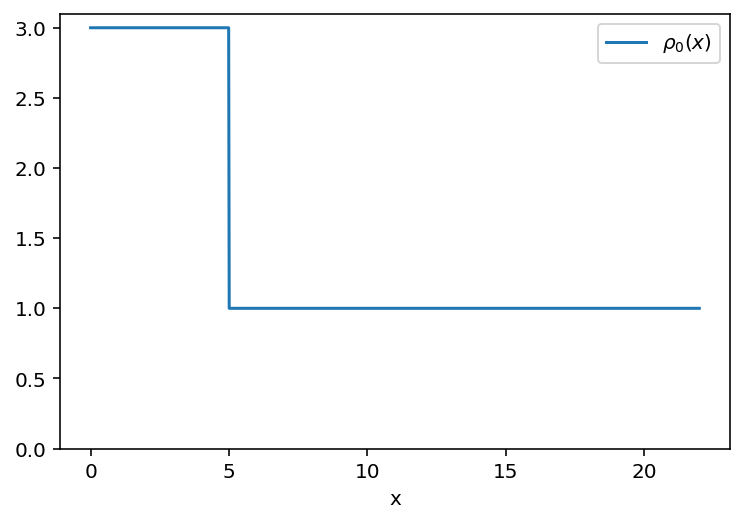

In [49]:
xmax = 22
x = np.linspace(-4, xmax, 1000)
x0 = np.linspace(0, xmax, 23)

x0 = np.delete(x0, x0==5)
x0 = np.append(x0, [4.99, 5.01])
x0 = np.sort(x0)

pmax = 10
umax = 5
def p0(x):
    return 2 * (x <= 5) + 1

def c(p):
    return umax * (1 - 2 * p / pmax);


plt.plot(x0, p0(x0), label='$\\rho_0(x)$');
plt.xlabel('x')
plt.ylim(0, 3.1)
plt.legend();
save_plot('Char_rh0')

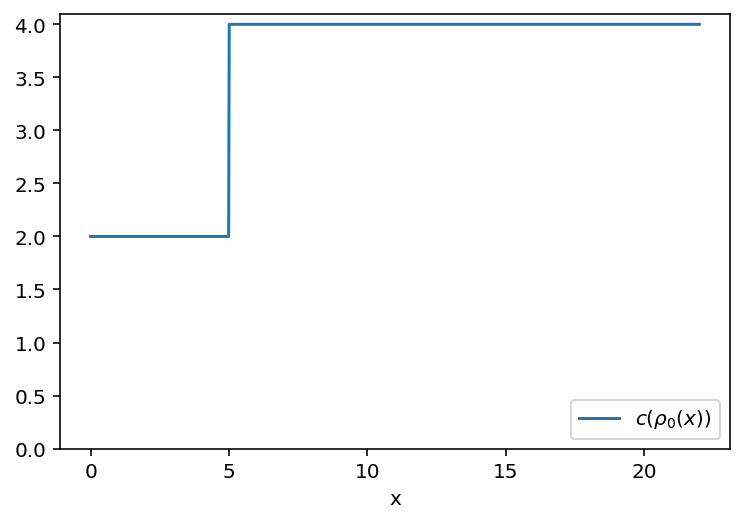

In [50]:
plt.plot(x0, c(p0(x0)), label='$c(\\rho_0(x))$');
plt.xlabel('x')
plt.ylim(0, 4.1)
plt.legend(loc='lower right');
save_plot('Char_crh0')

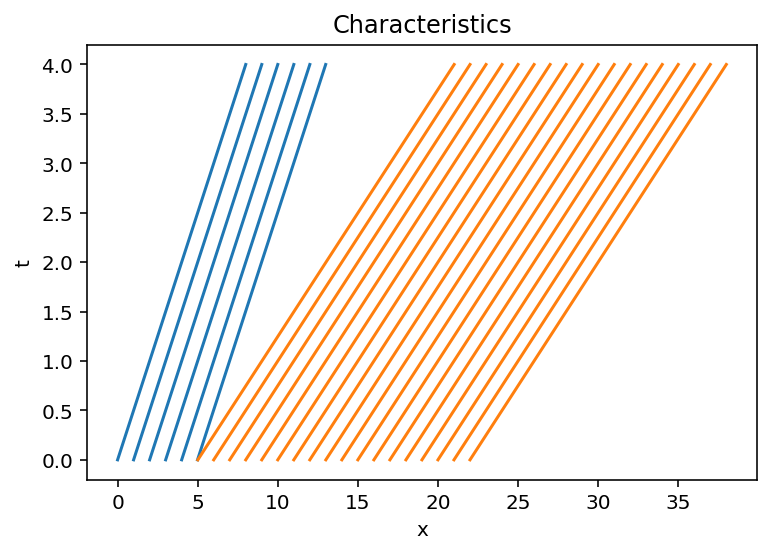

In [51]:
tmax = 4;
#plt.plot([x0, x0 + tmax * c(p0(x0))],[0*x0, tmax + 0*x0]);

x0_left = x0[x0<5]
x0_right = x0[x0>5]
plt.plot([x0_left, x0_left + tmax * c(p0(x0_left))],[0*x0_left, tmax + 0*x0_left], color=cc[0]);
plt.plot([x0_right, x0_right + tmax * c(p0(x0_right))],[0*x0_right, tmax + 0*x0_right], color=cc[1]);

plt.xlabel('x')
plt.ylabel('t')
plt.title('Characteristics');
save_plot('Char_lines')

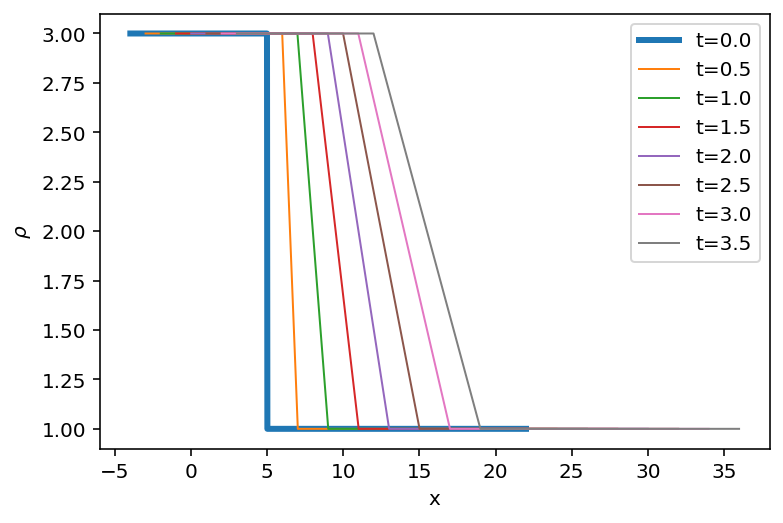

In [54]:
dt = 0.5
for ii in range(0, 8):
    t = ii * dt
    plt.plot(x + c(p0(x)) * t, p0(x), label='t={}'.format(t), lw=1+(ii==0)*2)
plt.legend();
plt.xlabel('x')
plt.ylabel('$\\rho$')


save_plot('Char_graphicalSolution')

### 3D plot of the above

Fig. 12.6.5 in Haberman

Text(0.5, 0, 't')

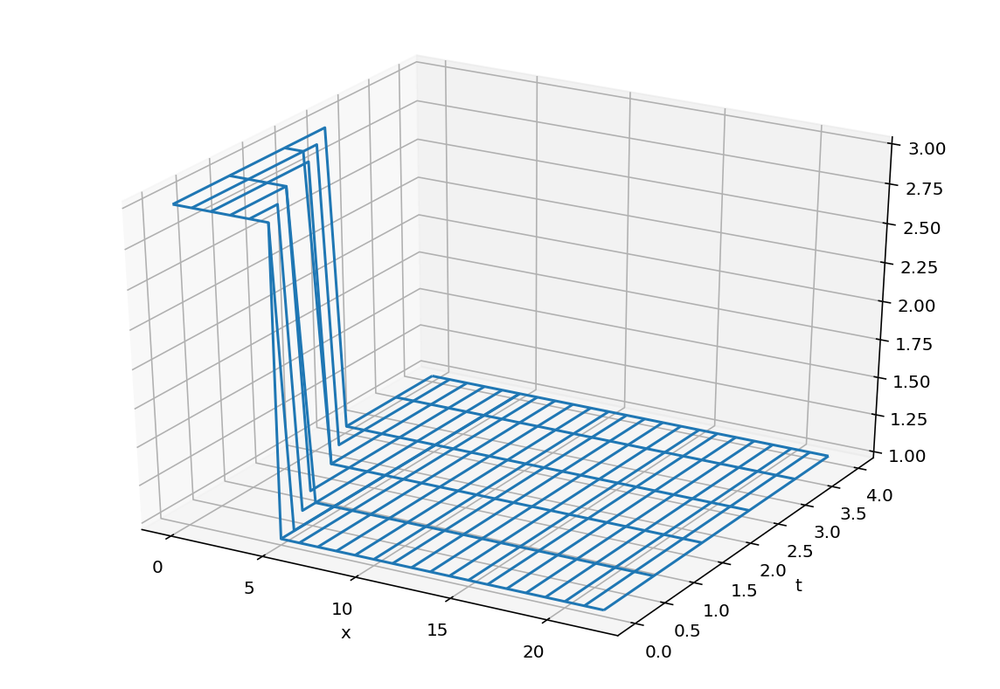

In [64]:
t = np.linspace(0, 4, 20)
X, T = np.meshgrid(x0, t)

xx = X + c(p0(X)) * T 

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(projection='3d')

ax.plot_wireframe(X, T, p0(xx), rcount=6);
ax.set_xlabel('x')
ax.set_ylabel('t')

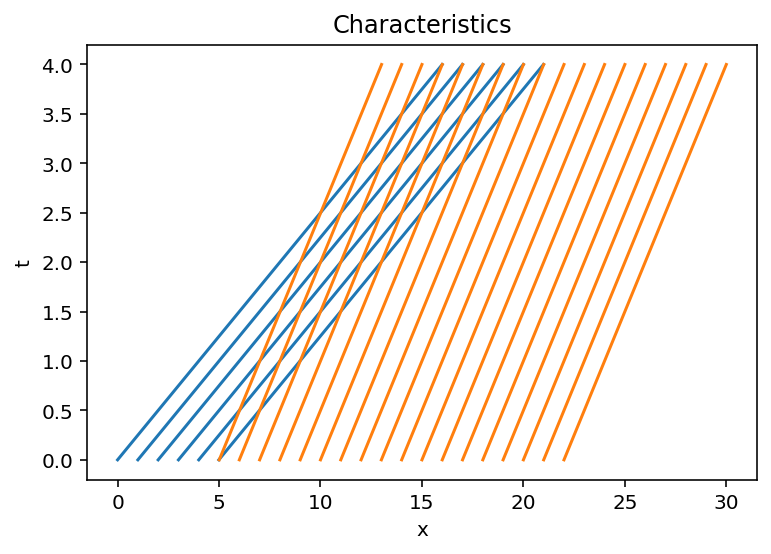

In [66]:
def p0(x):
    return 2 * (x >= 5) + 1

tmax = 4;
#plt.plot([x0, x0 + tmax * c(p0(x0))],[0*x0, tmax + 0*x0]);

x0_left = x0[x0<5]
x0_right = x0[x0>5]
plt.plot([x0_left, x0_left + tmax * c(p0(x0_left))],[0*x0_left, tmax + 0*x0_left], color=cc[0]);
plt.plot([x0_right, x0_right + tmax * c(p0(x0_right))],[0*x0_right, tmax + 0*x0_right], color=cc[1]);

plt.xlabel('x')
plt.ylabel('t')
plt.title('Characteristics');
save_plot('Char_lines_shock')

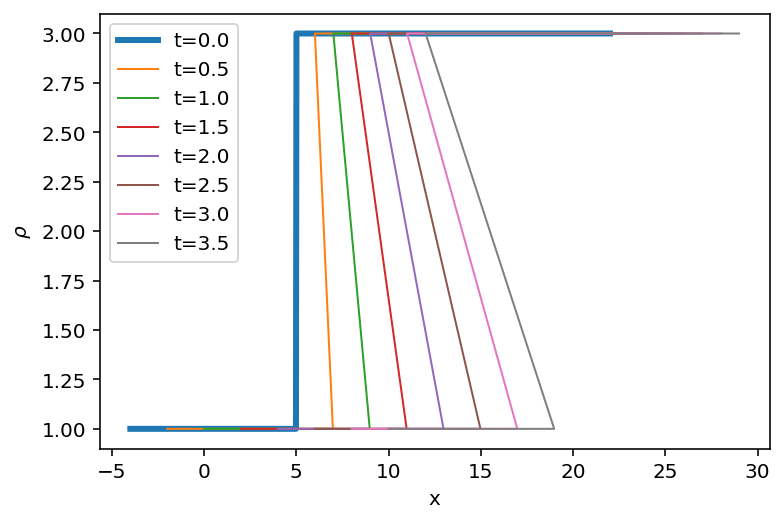

In [67]:
dt = 0.5
for ii in range(0, 8):
    t = ii * dt
    plt.plot(x + c(p0(x)) * t, p0(x), label='t={}'.format(t), lw=1+(ii==0)*2)
plt.legend();
plt.xlabel('x')
plt.ylabel('$\\rho$')


save_plot('Char_graphicalSolution_shock')

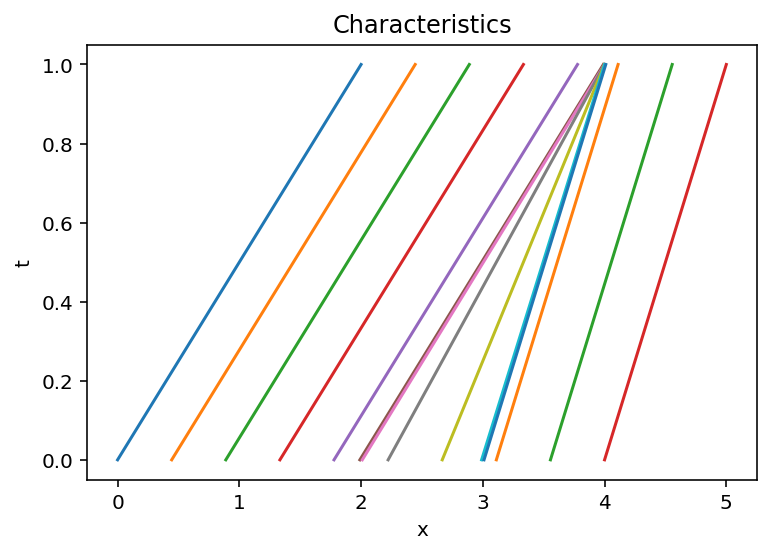

In [120]:
xmax = 4
x = np.linspace(-4, xmax, 1000)
x0 = np.linspace(0, xmax, 5*2)

x0 = np.delete(x0, (x0==2) | (x0==3)) 
x0 = np.append(x0, [1.99, 2.01, 2.99, 3.01])
x0 = np.sort(x0)



def c(p):
    return p

def p0(x):
    return 2 * (x < 2) + (x > 3) + (x<3)*(x>2)*(4 - x) 

tmax = 1;
#plt.plot([x0, x0 + tmax * c(p0(x0))],[0*x0, tmax + 0*x0]);

plt.plot([x0, x0 + tmax * c(p0(x0))],[0*x0, tmax + 0*x0]);

plt.xlabel('x')
plt.ylabel('t')
plt.title('Characteristics');
#save_plot('Char_lines_shock')

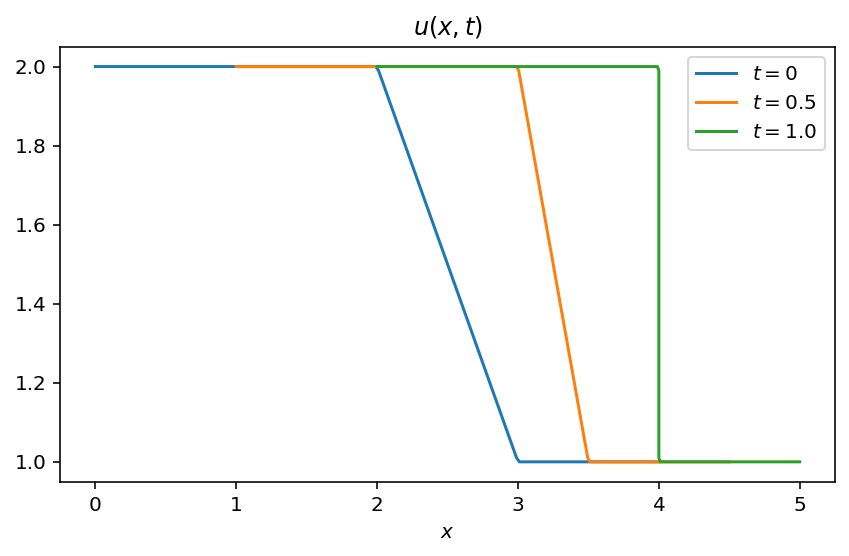

In [125]:
plt.plot(x0, p0(x0), label='$t=0$')
plt.plot(x0 + p0(x0) * 0.5, p0(x0), label='$t=0.5$')
plt.plot(x0 + p0(x0) * 1, p0(x0), label='$t=1.0$')
plt.legend();
plt.title('$u(x, t)$')
plt.xlabel('$x$')
plt.tight_layout()

save_plot('final_plot')

In [115]:
x0

array([0.        , 0.08163265, 0.16326531, 0.24489796, 0.32653061,
       0.40816327, 0.48979592, 0.57142857, 0.65306122, 0.73469388,
       0.81632653, 0.89795918, 0.97959184, 1.06122449, 1.14285714,
       1.2244898 , 1.30612245, 1.3877551 , 1.46938776, 1.55102041,
       1.63265306, 1.71428571, 1.79591837, 1.87755102, 1.95918367,
       2.04081633, 2.12244898, 2.20408163, 2.28571429, 2.36734694,
       2.44897959, 2.53061224, 2.6122449 , 2.69387755, 2.7755102 ,
       2.85714286, 2.93877551, 3.02040816, 3.10204082, 3.18367347,
       3.26530612, 3.34693878, 3.42857143, 3.51020408, 3.59183673,
       3.67346939, 3.75510204, 3.83673469, 3.91836735, 4.        ])

In [33]:
-1./np.log(np.log(2))

2.7284167729011495

In [35]:
x = np.array([ 58.54166667,  50.        ,  45.        ,  72.41666667,
       100.        ,  97.91666667,  40.        ,  40.54166667,
        81.25      ,  50.        ,  50.        ,  85.        ,
        84.58333333,  57.        ,  75.        ,  40.        ,
        48.125     ,  57.29166667,  59.58333333,  75.83333333,
        20.        ,  79.5       ,  35.        ,  57.375     ,
        31.45833333,  20.        ,  94.16666667,  15.        ,
        60.        ,  45.        ,  50.        ,  55.        ,
        28.33333333,  37.        ,  34.29166667,  37.5       ,
        36.08333333,  26.83333333,  31.66666667,  45.        ,
        38.        ,  45.        ,  59.58333333,  71.25      ,
        40.        ,  66.25      ,  26.08333333,  49.58333333,
        45.625     ,  55.41666667])

In [36]:
print(x)

[ 58.54166667  50.          45.          72.41666667 100.
  97.91666667  40.          40.54166667  81.25        50.
  50.          85.          84.58333333  57.          75.
  40.          48.125       57.29166667  59.58333333  75.83333333
  20.          79.5         35.          57.375       31.45833333
  20.          94.16666667  15.          60.          45.
  50.          55.          28.33333333  37.          34.29166667
  37.5         36.08333333  26.83333333  31.66666667  45.
  38.          45.          59.58333333  71.25        40.
  66.25        26.08333333  49.58333333  45.625       55.41666667]


In [37]:
len(x)

50

In [38]:
50/70

0.7142857142857143

In [39]:
x.min()

15.0